# Arsenal FC Project

### Plan 

#### Problématique : Qu'est ce qui peut expliquer le déclin d'arsenal sur les 10 dernières années ? 
#### A. Préparations, nettoyage et enrichissement du jeu de données
#### B. Analyse global du championnat
#### C. Analyse détaillé de la performance d'Arsenal
#### D. Comparaison de la performance d'Arsenal par rapport au championnat

#### E. Conclusion
  

## A. Préparations, nettoyage et enrichissement du jeu de données

### 1. Import des bibliothèques et du jeu de données

In [1]:
#Import des bibliothèques pandas et numpy 
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Import du dataset en .csv
Full_PL = pd.read_csv('df_full_premierleague.csv')

#Affichage du module .info
Full_PL.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4070 entries, 0 to 4069
Data columns (total 114 columns):
 #    Column                    Non-Null Count  Dtype  
---   ------                    --------------  -----  
 0    Unnamed: 0                4070 non-null   int64  
 1    link_match                4070 non-null   object 
 2    season                    4070 non-null   object 
 3    date                      4070 non-null   object 
 4    home_team                 4070 non-null   object 
 5    away_team                 4070 non-null   object 
 6    result_full               4070 non-null   object 
 7    result_ht                 4070 non-null   object 
 8    home_clearances           4070 non-null   float64
 9    home_corners              4070 non-null   float64
 10   home_fouls_conceded       4070 non-null   float64
 11   home_offsides             4070 non-null   float64
 12   home_passes               4070 non-null   float64
 13   home_possession           4070 non-null   floa

In [3]:
#Import du dataset en .csv
Full_PL = pd.read_csv('df_full_premierleague.csv')

#Affichage du module .info
Full_PL.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4070 entries, 0 to 4069
Data columns (total 114 columns):
 #    Column                    Non-Null Count  Dtype  
---   ------                    --------------  -----  
 0    Unnamed: 0                4070 non-null   int64  
 1    link_match                4070 non-null   object 
 2    season                    4070 non-null   object 
 3    date                      4070 non-null   object 
 4    home_team                 4070 non-null   object 
 5    away_team                 4070 non-null   object 
 6    result_full               4070 non-null   object 
 7    result_ht                 4070 non-null   object 
 8    home_clearances           4070 non-null   float64
 9    home_corners              4070 non-null   float64
 10   home_fouls_conceded       4070 non-null   float64
 11   home_offsides             4070 non-null   float64
 12   home_passes               4070 non-null   float64
 13   home_possession           4070 non-null   floa

## Webscrapring 


Nous allons insérer le dataframe issue du Web scraping dés a présent malgrés qu'on se soit aperçu que la saison 2020/2021 était incomplète un peu plus loin dans le notebook, afin de faciliter le nettoyage et l'intégration des données dans le Dataframe.

L'intégration du Dataframe nécessite tout d'abord le drop de tout les matchs de la saison 2020/2021 afin d'intégrer les nouvelles données.

In [4]:
# premier filtrage informatif avec la méthode isin 
option = ['20/21']
filtred_df = Full_PL[Full_PL['season'].isin(option)]
filtred_df.head()

,Unnamed: 0,link_match,season,date,home_team,away_team,result_full,result_ht,home_clearances,home_corners,...,tackles_avg_away,touches_avg_away,yellow_cards_avg_away,goals_scored_ft_avg_away,goals_conced_ft_avg_away,sg_match_ft_acum_away,goals_scored_ht_avg_away,goals_conced_ht_avg_away,sg_match_ht_acum_away,performance_acum_away
3799,3799,https://www.premierleague.com/match/59060,20/21,2021-01-01,Everton,West Ham United,0-1,0-0,16.0,5.0,...,14.6,571.2,1.2,1.44,1.31,2.0,0.56,0.62,-1.0,47.9
3800,3800,https://www.premierleague.com/match/59061,20/21,2021-01-01,Manchester United,Aston Villa,2-1,1-0,25.0,5.0,...,12.4,589.3,1.9,2.00,1.00,14.0,0.71,0.50,3.0,61.9
3801,3801,https://www.premierleague.com/match/59010,20/21,2020-12-11,Leeds United,West Ham United,1-2,1-1,15.0,5.0,...,14.0,567.5,1.5,1.64,1.27,4.0,0.73,0.55,2.0,51.5
3802,3802,https://www.premierleague.com/match/59145,20/21,2021-02-19,Wolverhampton Wanderers,Leeds United,1-0,0-0,12.0,7.0,...,18.9,734.6,1.5,1.74,1.83,-2.0,0.74,1.13,-9.0,46.4
3803,3803,https://www.premierleague.com/match/58947,20/21,2020-10-23,Aston Villa,Leeds United,0-3,0-0,22.0,6.0,...,22.0,703.0,1.2,1.80,1.80,0.0,0.80,1.00,-1.0,46.7


In [5]:
# lecture des données issues du web scraping
Full_PL_annexe = pd.read_csv('season_2020_2021.csv')
Full_PL_annexe.head()

,Unnamed: 0,season,date,home_team,away_team,result_full
0,0,20/21,2021-05-23,Arsenal,Brighton,2-0
1,1,20/21,2021-05-23,Aston Villa,Chelsea,2-1
2,2,20/21,2021-05-23,Fulham,Newcastle,0-2
3,3,20/21,2021-05-23,Leeds,West Brom,3-1
4,4,20/21,2021-05-23,Leicester,Spurs,2-4


In [6]:
#Creation d'un dictionnaire afin d'homogeneiser la data pour le traitement de données
replace_data = { "Leeds": 'Leeds United',
                 "Wolves": 'Wolverhampton Wanderers',
                 "Man City": 'Manchester City',
                 "Sheffield Utd": 'Sheffield United',
                "Leicester": 'Leicester City',
                "Newcastle": 'Newcastle United',
                "West Brom": 'West Bromwich Albion',
                "Man Utd": 'Manchester United',
                "Brighton": 'Brighton and Hove Albion',
                "Spurs": 'Tottenham Hotspur',
                "West Ham": 'West Ham United'
               }

Full_PL_annexe= Full_PL_annexe.replace({"home_team": replace_data, "away_team": replace_data })

In [7]:
# vérification de la modification des valeurs 
print(filtred_df['home_team'].unique())
print(Full_PL_annexe['home_team'].unique())

['Everton' 'Manchester United' 'Leeds United' 'Wolverhampton Wanderers'
 'Aston Villa' 'Crystal Palace' 'Brighton and Hove Albion' 'Southampton'
 'Sheffield United' 'Chelsea' 'West Ham United' 'Arsenal'
 'West Bromwich Albion' 'Fulham' 'Burnley' 'Liverpool' 'Leicester City'
 'Newcastle United' 'Manchester City' 'Tottenham Hotspur']
['Arsenal' 'Aston Villa' 'Fulham' 'Leeds United' 'Leicester City'
 'Liverpool' 'Manchester City' 'Sheffield United' 'West Ham United'
 'Wolverhampton Wanderers' 'Everton' 'Newcastle United'
 'Tottenham Hotspur' 'Crystal Palace' 'Burnley' 'West Bromwich Albion'
 'Manchester United' 'Southampton' 'Brighton and Hove Albion' 'Chelsea']


In [8]:
# création d'une colonne clé afin de concatener les données scrapper avec les données manquantes sur la saison 2020 2021
filtred_df['merge_key'] = filtred_df['season'] + filtred_df['date'] + filtred_df['home_team'] + filtred_df['away_team']
Full_PL_annexe['merge_key'] = Full_PL_annexe['season'] + Full_PL_annexe['date'] + Full_PL_annexe['home_team'] + Full_PL_annexe['away_team']

In [9]:
# concatenation des données
Full_PL_rei = pd.concat([Full_PL_annexe,filtred_df], ignore_index=True)
Full_PL_rei

,Unnamed: 0,season,date,home_team,away_team,result_full,merge_key,link_match,result_ht,home_clearances,...,tackles_avg_away,touches_avg_away,yellow_cards_avg_away,goals_scored_ft_avg_away,goals_conced_ft_avg_away,sg_match_ft_acum_away,goals_scored_ht_avg_away,goals_conced_ht_avg_away,sg_match_ht_acum_away,performance_acum_away
0,0,20/21,2021-05-23,Arsenal,Brighton and Hove Albion,2-0,20/212021-05-23ArsenalBrighton and Hove Albion,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,20/21,2021-05-23,Aston Villa,Chelsea,2-1,20/212021-05-23Aston VillaChelsea,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,20/21,2021-05-23,Fulham,Newcastle United,0-2,20/212021-05-23FulhamNewcastle United,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,20/21,2021-05-23,Leeds United,West Bromwich Albion,3-1,20/212021-05-23Leeds UnitedWest Bromwich Albion,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,20/21,2021-05-23,Leicester City,Tottenham Hotspur,2-4,20/212021-05-23Leicester CityTottenham Hotspur,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
646,4065,20/21,2021-02-03,Liverpool,Brighton and Hove Albion,0-1,20/212021-02-03LiverpoolBrighton and Hove Albion,https://www.premierleague.com/match/59113,0-0,15.0,...,16.8,651.0,1.5,1.10,1.38,-6.0,0.52,0.67,-3.0,33.3
647,4066,20/21,2021-03-03,Burnley,Leicester City,1-1,20/212021-03-03BurnleyLeicester City,https://www.premierleague.com/match/59177,1-1,13.0,...,17.7,679.0,1.8,1.73,1.15,15.0,0.77,0.58,5.0,62.8
648,4067,20/21,2021-03-03,Crystal Palace,Manchester United,0-0,20/212021-03-03Crystal PalaceManchester United,https://www.premierleague.com/match/59178,0-0,25.0,...,14.9,742.6,1.6,2.04,1.23,21.0,0.85,0.69,4.0,64.1
649,4068,20/21,2021-03-03,Sheffield United,Aston Villa,1-0,20/212021-03-03Sheffield UnitedAston Villa,https://www.premierleague.com/match/59182,1-0,47.0,...,13.3,587.0,1.7,1.58,1.08,12.0,0.67,0.42,6.0,54.2


In [10]:
# netoyage des doublons avecc la focntion drop_duplicates de pandas
Full_PL_nibi_2 = Full_PL_rei.drop_duplicates(subset='merge_key',keep='last')
# vérification 
Full_PL_nibi_2
print(len(Full_PL_nibi_2))

380


In [11]:
# suppresion des valeurs manquantes de la colonne link_match
Full_PL_nibi_2['link_match'] = Full_PL_nibi_2['link_match'].fillna('https://www.premierleague.com/results?co=1&se=363&cl=-1')
Full_PL_nibi_2['link_match'].info()

<class 'pandas.core.series.Series'>
Int64Index: 380 entries, 0 to 650
Series name: link_match
Non-Null Count  Dtype 
--------------  ----- 
380 non-null    object
dtypes: object(1)
memory usage: 5.9+ KB


In [12]:
#remplacement des valeurs manquantes par la médiane, afin d'homogeneiser les statistiques de la saison 
Full_PL_nibi_22 = Full_PL_nibi_2.fillna(Full_PL_nibi_2.median())
Full_PL_nibi_22

,Unnamed: 0,season,date,home_team,away_team,result_full,merge_key,link_match,result_ht,home_clearances,...,tackles_avg_away,touches_avg_away,yellow_cards_avg_away,goals_scored_ft_avg_away,goals_conced_ft_avg_away,sg_match_ft_acum_away,goals_scored_ht_avg_away,goals_conced_ht_avg_away,sg_match_ht_acum_away,performance_acum_away
0,0,20/21,2021-05-23,Arsenal,Brighton and Hove Albion,2-0,20/212021-05-23ArsenalBrighton and Hove Albion,https://www.premierleague.com/results?co=1&se=...,NaN,15.0,...,15.0,668.6,1.5,1.52,1.42,0.0,0.65,0.67,0.0,50.0
1,1,20/21,2021-05-23,Aston Villa,Chelsea,2-1,20/212021-05-23Aston VillaChelsea,https://www.premierleague.com/results?co=1&se=...,NaN,15.0,...,15.0,668.6,1.5,1.52,1.42,0.0,0.65,0.67,0.0,50.0
2,2,20/21,2021-05-23,Fulham,Newcastle United,0-2,20/212021-05-23FulhamNewcastle United,https://www.premierleague.com/results?co=1&se=...,NaN,15.0,...,15.0,668.6,1.5,1.52,1.42,0.0,0.65,0.67,0.0,50.0
3,3,20/21,2021-05-23,Leeds United,West Bromwich Albion,3-1,20/212021-05-23Leeds UnitedWest Bromwich Albion,https://www.premierleague.com/results?co=1&se=...,NaN,15.0,...,15.0,668.6,1.5,1.52,1.42,0.0,0.65,0.67,0.0,50.0
4,4,20/21,2021-05-23,Leicester City,Tottenham Hotspur,2-4,20/212021-05-23Leicester CityTottenham Hotspur,https://www.premierleague.com/results?co=1&se=...,NaN,15.0,...,15.0,668.6,1.5,1.52,1.42,0.0,0.65,0.67,0.0,50.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
646,4065,20/21,2021-02-03,Liverpool,Brighton and Hove Albion,0-1,20/212021-02-03LiverpoolBrighton and Hove Albion,https://www.premierleague.com/match/59113,0-0,15.0,...,16.8,651.0,1.5,1.10,1.38,-6.0,0.52,0.67,-3.0,33.3
647,4066,20/21,2021-03-03,Burnley,Leicester City,1-1,20/212021-03-03BurnleyLeicester City,https://www.premierleague.com/match/59177,1-1,13.0,...,17.7,679.0,1.8,1.73,1.15,15.0,0.77,0.58,5.0,62.8
648,4067,20/21,2021-03-03,Crystal Palace,Manchester United,0-0,20/212021-03-03Crystal PalaceManchester United,https://www.premierleague.com/match/59178,0-0,25.0,...,14.9,742.6,1.6,2.04,1.23,21.0,0.85,0.69,4.0,64.1
649,4068,20/21,2021-03-03,Sheffield United,Aston Villa,1-0,20/212021-03-03Sheffield UnitedAston Villa,https://www.premierleague.com/match/59182,1-0,47.0,...,13.3,587.0,1.7,1.58,1.08,12.0,0.67,0.42,6.0,54.2


In [13]:
# reindexage des colonnes afin de faciliter la futur concatenation dans le dataframe final
Full_PL_juu = Full_PL_nibi_22.reindex(['Unnamed: 0 ','link_match','season','date','home_team','away_team','result_full','result_ht','home_clearances','home_corners','home_fouls_conceded','home_offsides',
                                       'home_passes','home_possession','home_red_cards','home_shots','home_shots_on_target','home_tackles','home_touches',
                                       'home_yellow_cards','away_clearances','away_corners','away_fouls_conceded','away_offsides','away_passes','away_possession',
                                       'away_red_cards','away_shots','away_shots_on_target','away_tackles','away_touches','away_yellow_cards',
                                       'goal_home_ft','goal_away_ft','sg_match_ft','goal_home_ht','goal_away_ht','sg_match_ht','clearances_avg_H',
                                       'corners_avg_H','fouls_conceded_avg_H','offsides_avg_H','passes_avg_H','possession_avg_H','red_cards_avg_H',
                                       'shots_avg_H','shots_on_target_avg_H','tackles_avg_H','touches_avg_H','yellow_cards_avg_H','goals_scored_ft_avg_H',
                                       'goals_conced_ft_avg_H','sg_match_ft_acum_H','goals_scored_ht_avg_H','goals_conced_ht_avg_H','sg_match_ht_acum_H',
                                       'performance_acum_H','clearances_avg_A','corners_avg_A','fouls_conceded_avg_A','offsides_avg_A','passes_avg_A',
                                       'possession_avg_A','red_cards_avg_A','shots_avg_A','shots_on_target_avg_A','tackles_avg_A','touches_avg_A',
                                       'yellow_cards_avg_A','goals_scored_ft_avg_A','goals_conced_ft_avg_A','sg_match_ft_acum_A','goals_scored_ht_avg_A',
                                       'goals_conced_ht_avg_A','sg_match_ht_acum_A','performance_acum_A','clearances_avg_home','corners_avg_home',
                                       'fouls_conceded_avg_home','offsides_avg_home','passes_avg_home','possession_avg_home','red_cards_avg_home',
                                       'shots_avg_home','shots_on_target_avg_home','tackles_avg_home','touches_avg_home','yellow_cards_avg_home',
                                       'goals_scored_ft_avg_home','goals_conced_ft_avg_home','sg_match_ft_acum_home','goals_scored_ht_avg_home',
                                       'goals_conced_ht_avg_home','sg_match_ht_acum_home','performance_acum_home','clearances_avg_away','corners_avg_away',
                                       'fouls_conceded_avg_away','offsides_avg_away','passes_avg_away','possession_avg_away','red_cards_avg_away',
                                       'shots_avg_away','shots_on_target_avg_away','tackles_avg_away','touches_avg_away','yellow_cards_avg_away',
                                       'goals_scored_ft_avg_away','goals_conced_ft_avg_away','sg_match_ft_acum_away','goals_scored_ht_avg_away',
                                       'goals_conced_ht_avg_away','sg_match_ht_acum_away','performance_acum_away'], axis=1)
Full_PL_juu

,Unnamed: 0,link_match,season,date,home_team,away_team,result_full,result_ht,home_clearances,home_corners,...,tackles_avg_away,touches_avg_away,yellow_cards_avg_away,goals_scored_ft_avg_away,goals_conced_ft_avg_away,sg_match_ft_acum_away,goals_scored_ht_avg_away,goals_conced_ht_avg_away,sg_match_ht_acum_away,performance_acum_away
0,NaN,https://www.premierleague.com/results?co=1&se=...,20/21,2021-05-23,Arsenal,Brighton and Hove Albion,2-0,NaN,15.0,5.0,...,15.0,668.6,1.5,1.52,1.42,0.0,0.65,0.67,0.0,50.0
1,NaN,https://www.premierleague.com/results?co=1&se=...,20/21,2021-05-23,Aston Villa,Chelsea,2-1,NaN,15.0,5.0,...,15.0,668.6,1.5,1.52,1.42,0.0,0.65,0.67,0.0,50.0
2,NaN,https://www.premierleague.com/results?co=1&se=...,20/21,2021-05-23,Fulham,Newcastle United,0-2,NaN,15.0,5.0,...,15.0,668.6,1.5,1.52,1.42,0.0,0.65,0.67,0.0,50.0
3,NaN,https://www.premierleague.com/results?co=1&se=...,20/21,2021-05-23,Leeds United,West Bromwich Albion,3-1,NaN,15.0,5.0,...,15.0,668.6,1.5,1.52,1.42,0.0,0.65,0.67,0.0,50.0
4,NaN,https://www.premierleague.com/results?co=1&se=...,20/21,2021-05-23,Leicester City,Tottenham Hotspur,2-4,NaN,15.0,5.0,...,15.0,668.6,1.5,1.52,1.42,0.0,0.65,0.67,0.0,50.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
646,NaN,https://www.premierleague.com/match/59113,20/21,2021-02-03,Liverpool,Brighton and Hove Albion,0-1,0-0,15.0,5.0,...,16.8,651.0,1.5,1.10,1.38,-6.0,0.52,0.67,-3.0,33.3
647,NaN,https://www.premierleague.com/match/59177,20/21,2021-03-03,Burnley,Leicester City,1-1,1-1,13.0,5.0,...,17.7,679.0,1.8,1.73,1.15,15.0,0.77,0.58,5.0,62.8
648,NaN,https://www.premierleague.com/match/59178,20/21,2021-03-03,Crystal Palace,Manchester United,0-0,0-0,25.0,4.0,...,14.9,742.6,1.6,2.04,1.23,21.0,0.85,0.69,4.0,64.1
649,NaN,https://www.premierleague.com/match/59182,20/21,2021-03-03,Sheffield United,Aston Villa,1-0,1-0,47.0,2.0,...,13.3,587.0,1.7,1.58,1.08,12.0,0.67,0.42,6.0,54.2


In [14]:
# vérification 
Full_PL_juu.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 380 entries, 0 to 650
Data columns (total 114 columns):
 #    Column                    Non-Null Count  Dtype  
---   ------                    --------------  -----  
 0    Unnamed: 0                0 non-null      float64
 1    link_match                380 non-null    object 
 2    season                    380 non-null    object 
 3    date                      380 non-null    object 
 4    home_team                 380 non-null    object 
 5    away_team                 380 non-null    object 
 6    result_full               380 non-null    object 
 7    result_ht                 271 non-null    object 
 8    home_clearances           380 non-null    float64
 9    home_corners              380 non-null    float64
 10   home_fouls_conceded       380 non-null    float64
 11   home_offsides             380 non-null    float64
 12   home_passes               380 non-null    float64
 13   home_possession           380 non-null    float6

In [15]:
# suppression des données concernant toute la saison 2020/2021 du dataframe originel 
indexnames= Full_PL[(Full_PL['season'] == '20/21')].index
Full_PL_go = Full_PL.drop(indexnames)
Full_PL_go

,Unnamed: 0,link_match,season,date,home_team,away_team,result_full,result_ht,home_clearances,home_corners,...,tackles_avg_away,touches_avg_away,yellow_cards_avg_away,goals_scored_ft_avg_away,goals_conced_ft_avg_away,sg_match_ft_acum_away,goals_scored_ht_avg_away,goals_conced_ht_avg_away,sg_match_ht_acum_away,performance_acum_away
0,0,https://www.premierleague.com/match/7186,10/11,2010-11-01,Blackpool,West Bromwich Albion,2-1,1-0,15.0,8.0,...,20.0,584.9,1.6,1.44,1.67,-2.0,0.33,0.78,-4.0,55.6
1,1,https://www.premierleague.com/match/7404,10/11,2011-04-11,Liverpool,Manchester City,3-0,3-0,16.0,6.0,...,22.0,681.4,2.0,1.61,0.87,23.0,0.87,0.32,17.0,60.2
2,2,https://www.premierleague.com/match/7255,10/11,2010-12-13,Manchester United,Arsenal,1-0,1-0,26.0,5.0,...,21.2,748.0,1.8,2.12,1.12,16.0,0.94,0.38,9.0,66.7
3,3,https://www.premierleague.com/match/7126,10/11,2010-09-13,Stoke City,Aston Villa,2-1,0-1,26.0,8.0,...,25.0,567.3,2.0,1.33,2.00,-2.0,1.00,1.00,0.0,66.7
4,4,https://www.premierleague.com/match/7350,10/11,2011-02-14,Fulham,Chelsea,0-0,0-0,50.0,4.0,...,19.4,728.6,1.4,1.84,0.88,24.0,0.84,0.48,9.0,58.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3794,3794,https://www.premierleague.com/match/46750,19/20,2019-12-04,Wolverhampton Wanderers,West Ham United,2-0,1-0,17.0,5.0,...,18.6,637.1,1.9,1.21,1.64,-6.0,0.36,0.71,-5.0,38.1
3795,3795,https://www.premierleague.com/match/46938,19/20,2020-07-08,Brighton and Hove Albion,Liverpool,1-3,1-2,39.0,6.0,...,14.7,815.7,0.9,2.18,0.76,47.0,1.09,0.33,25.0,89.9
3796,3796,https://www.premierleague.com/match/46941,19/20,2020-07-08,Manchester City,Newcastle United,5-0,2-0,11.0,8.0,...,15.8,535.5,1.7,1.06,1.36,-10.0,0.42,0.58,-5.0,43.4
3797,3797,https://www.premierleague.com/match/46942,19/20,2020-07-08,Sheffield United,Wolverhampton Wanderers,1-0,0-0,15.0,6.0,...,17.4,630.5,1.6,1.36,1.09,9.0,0.36,0.73,-12.0,52.5


In [16]:
# ajout de la saison 2020/2021 complète
Full_PL_last = pd.concat([Full_PL_go,Full_PL_juu], ignore_index=True)
Full_PL_last

,Unnamed: 0,link_match,season,date,home_team,away_team,result_full,result_ht,home_clearances,home_corners,...,touches_avg_away,yellow_cards_avg_away,goals_scored_ft_avg_away,goals_conced_ft_avg_away,sg_match_ft_acum_away,goals_scored_ht_avg_away,goals_conced_ht_avg_away,sg_match_ht_acum_away,performance_acum_away,Unnamed: 0
0,0.0,https://www.premierleague.com/match/7186,10/11,2010-11-01,Blackpool,West Bromwich Albion,2-1,1-0,15.0,8.0,...,584.9,1.6,1.44,1.67,-2.0,0.33,0.78,-4.0,55.6,NaN
1,1.0,https://www.premierleague.com/match/7404,10/11,2011-04-11,Liverpool,Manchester City,3-0,3-0,16.0,6.0,...,681.4,2.0,1.61,0.87,23.0,0.87,0.32,17.0,60.2,NaN
2,2.0,https://www.premierleague.com/match/7255,10/11,2010-12-13,Manchester United,Arsenal,1-0,1-0,26.0,5.0,...,748.0,1.8,2.12,1.12,16.0,0.94,0.38,9.0,66.7,NaN
3,3.0,https://www.premierleague.com/match/7126,10/11,2010-09-13,Stoke City,Aston Villa,2-1,0-1,26.0,8.0,...,567.3,2.0,1.33,2.00,-2.0,1.00,1.00,0.0,66.7,NaN
4,4.0,https://www.premierleague.com/match/7350,10/11,2011-02-14,Fulham,Chelsea,0-0,0-0,50.0,4.0,...,728.6,1.4,1.84,0.88,24.0,0.84,0.48,9.0,58.7,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4174,NaN,https://www.premierleague.com/match/59113,20/21,2021-02-03,Liverpool,Brighton and Hove Albion,0-1,0-0,15.0,5.0,...,651.0,1.5,1.10,1.38,-6.0,0.52,0.67,-3.0,33.3,NaN
4175,NaN,https://www.premierleague.com/match/59177,20/21,2021-03-03,Burnley,Leicester City,1-1,1-1,13.0,5.0,...,679.0,1.8,1.73,1.15,15.0,0.77,0.58,5.0,62.8,NaN
4176,NaN,https://www.premierleague.com/match/59178,20/21,2021-03-03,Crystal Palace,Manchester United,0-0,0-0,25.0,4.0,...,742.6,1.6,2.04,1.23,21.0,0.85,0.69,4.0,64.1,NaN
4177,NaN,https://www.premierleague.com/match/59182,20/21,2021-03-03,Sheffield United,Aston Villa,1-0,1-0,47.0,2.0,...,587.0,1.7,1.58,1.08,12.0,0.67,0.42,6.0,54.2,NaN


## 2. Analyse technique du jeu de données

In [17]:
#Analyse appronfondis du jeu de données 
def summary(Full_PL_last):
    table = pd.DataFrame(
        index=Full_PL_last.columns,
        columns=['type_info', '%_missing_values', 'nb_unique_values'])
    table.loc[:, 'type_info'] = Full_PL_last.dtypes.values
    table.loc[:, '%_missing_values'] = Full_PL_last.isna().sum().values / len(Full_PL_last)
    table.loc[:, 'nb_unique_values'] = Full_PL_last.nunique().values

    def get_list_unique_values(Full_PL_last):
        dict_ = {}
        for col in Full_PL_last.columns:
            if Full_PL_last[col].nunique() < 6:
                dict_[col] = list(Full_PL_last[col].unique())
            else:
                if Full_PL_last[col].dtypes == "O":
                    dict_[col] = "Too much categories..."
                else:
                    dict_[col] = "Too much values..."
        return pd.DataFrame({'unique_values': dict_.values()},
                            index=Full_PL_last.columns)

    infos_table_int1 = pd.merge(table,
                                get_list_unique_values(Full_PL_last),
                                left_index=True,
                                right_index=True)

    def get_mean_mode(Full_PL_last):
        dict_ = {}
        for col in Full_PL_last.columns:
            if Full_PL_last[col].dtypes == "O":
                dict_[col] = Full_PL_last[col].mode()[0]
            else:
                dict_[col] = Full_PL_last[col].mean()
        return pd.DataFrame(pd.Series(dict_), columns=["mean_mode_values"])

    infos_table_int2 = pd.merge(infos_table_int1,
                                get_mean_mode(Full_PL_last),
                                left_index=True,
                                right_index=True)

    def alerts(Full_PL_last):
        thresh_na = 0.25
        thresh_balance = 0.8
        dict_ = {}
        for col in Full_PL_last.columns:
            if (Full_PL_last[col].count() / len(Full_PL_last)) < thresh_na:
                dict_[col] = "Too much missing values ! "
            elif Full_PL_last[col].value_counts(
                    normalize=True).values[0] > thresh_balance:
                dict_[col] = "It's imbalanced !"
            else:
                dict_[col] = "Nothing to report"

        return pd.DataFrame(pd.Series(dict_), columns=["flag"])

    infos_table = pd.merge(infos_table_int2,
                           alerts(Full_PL_last),
                           left_index=True,
                           right_index=True)

    return infos_table


summary(Full_PL_last)


,type_info,%_missing_values,nb_unique_values,unique_values,mean_mode_values,flag
Unnamed: 0,float64,0.090931,3799,Too much values...,1899.0,Nothing to report
link_match,object,0.000000,4071,Too much categories...,https://www.premierleague.com/results?co=1&se=...,Nothing to report
season,object,0.000000,11,Too much categories...,10/11,Nothing to report
date,object,0.000000,1169,Too much categories...,2011-05-22,Nothing to report
home_team,object,0.000000,37,Too much categories...,Arsenal,Nothing to report
...,...,...,...,...,...,...
goals_scored_ht_avg_away,float64,0.023929,149,Too much values...,0.610753,Nothing to report
goals_conced_ht_avg_away,float64,0.023929,124,Too much values...,0.603329,Nothing to report
sg_match_ht_acum_away,float64,0.023929,63,Too much values...,0.06178,Nothing to report
performance_acum_away,float64,0.023929,555,Too much values...,46.040672,Nothing to report


## 3. Traitement des valeurs manquantes avec la création d'un data frame "nettoyé" (replace by median)

In [18]:
Clean_Full_PL = Full_PL_last.fillna(Full_PL_last.median())

* Création d'un nouveau dataframe "propre" ou nous avons retraiter les valeurs manquantes par la médiane. Cette méthode nous permet de conserver un maximum de data à exploité pour être vraiment pertinant dans notre analyse qui sera détaillés dans la partie data viz' 

In [19]:
#Vérification du retraitement des NANs
Clean_Full_PL.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4179 entries, 0 to 4178
Data columns (total 115 columns):
 #    Column                    Non-Null Count  Dtype  
---   ------                    --------------  -----  
 0    Unnamed: 0                4179 non-null   float64
 1    link_match                4179 non-null   object 
 2    season                    4179 non-null   object 
 3    date                      4179 non-null   object 
 4    home_team                 4179 non-null   object 
 5    away_team                 4179 non-null   object 
 6    result_full               4179 non-null   object 
 7    result_ht                 4070 non-null   object 
 8    home_clearances           4179 non-null   float64
 9    home_corners              4179 non-null   float64
 10   home_fouls_conceded       4179 non-null   float64
 11   home_offsides             4179 non-null   float64
 12   home_passes               4179 non-null   float64
 13   home_possession           4179 non-null   floa

* On peut observer que le jeu de données n'a plus aucune valeurs manquantes. Sur les 4070 entrées, on observe bien que les 113 champs ont bien 4070 valeurs non null 

## Aperçu des données

On utilise ici, la méthode describe afin d'avoir un aperçu des données que nous allons exploiter par la suite.

In [20]:
Clean_Full_PL.describe()

,Unnamed: 0,home_clearances,home_corners,home_fouls_conceded,home_offsides,home_passes,home_possession,home_red_cards,home_shots,home_shots_on_target,...,touches_avg_away,yellow_cards_avg_away,goals_scored_ft_avg_away,goals_conced_ft_avg_away,sg_match_ft_acum_away,goals_scored_ht_avg_away,goals_conced_ht_avg_away,sg_match_ht_acum_away,performance_acum_away,Unnamed: 0
count,4179.000000,4179.000000,4179.000000,4179.000000,4179.000000,4179.000000,4179.000000,4179.000000,4179.000000,4179.000000,...,4179.000000,4179.000000,4179.000000,4179.000000,4179.000000,4179.000000,4179.000000,4179.000000,4179.000000,0.0
mean,1899.000000,24.468055,5.921034,10.784398,2.096674,451.095956,51.221776,0.058148,14.479062,4.799474,...,644.261163,1.653888,1.379868,1.368119,0.147404,0.609538,0.603250,0.060302,45.987054,NaN
std,1045.752916,11.200664,3.099435,3.389603,1.668776,124.093657,11.378484,0.241103,5.707253,2.602332,...,88.252092,0.444816,0.580618,0.472424,15.155277,0.318302,0.273686,7.611133,19.074365,NaN
min,0.000000,0.000000,0.000000,0.000000,0.000000,176.000000,18.000000,0.000000,0.000000,0.000000,...,375.000000,0.000000,0.000000,0.000000,-54.000000,0.000000,0.000000,-26.000000,0.000000,NaN
25%,1044.500000,16.000000,4.000000,8.000000,1.000000,361.000000,43.300000,0.000000,10.500000,3.000000,...,580.100000,1.400000,1.000000,1.090000,-9.000000,0.420000,0.440000,-4.000000,33.300000,NaN
50%,1899.000000,23.000000,5.000000,11.000000,2.000000,439.000000,50.900000,0.000000,14.000000,4.000000,...,628.100000,1.600000,1.280000,1.350000,-1.000000,0.560000,0.600000,0.000000,43.800000,NaN
75%,2753.500000,31.000000,8.000000,13.000000,3.000000,525.000000,59.400000,0.000000,18.000000,6.000000,...,708.500000,1.900000,1.670000,1.620000,6.000000,0.760000,0.750000,3.000000,57.800000,NaN
max,3798.000000,73.000000,19.000000,24.000000,11.000000,1015.000000,82.900000,2.000000,44.000000,17.000000,...,975.000000,5.000000,6.000000,5.000000,78.000000,4.000000,3.000000,38.000000,100.000000,NaN


On peut remarquer lors de cette première lecture les choses suivantes: 
- une equipe a domicile gagne plus de match que lorsqu'elle se trouve a l'extérieur
- une equipe a domicile, en moyenne,  marque plus de buts a domicile et tir plus au buts que l'équipe extérieur
- le nombre de buts maximum marqué lors d'un match est de 9; et le nombre de buts maximum marqué a la mi-temps est de 5.

## 4. Enrichissement du jeu de données avec la création de valeur cible permettant l'analyse

In [21]:
##Retraitement global toutes équipes confondues :

#Split du résultat du match, afin de déterminer le vainqueur dans une seconde étape
Clean_Full_PL['home'] = Clean_Full_PL['result_full'].str.split('-').str[0]
Clean_Full_PL['away'] = Clean_Full_PL['result_full'].str.split('-').str[1]

#Création de la colonne dans laquelle nous stockerons le vainqueur du match
Clean_Full_PL['Winner'] = '0'

#Conversion des deux champs créer en int
Clean_Full_PL['home'] = Clean_Full_PL['home'].astype(int)
Clean_Full_PL['away'] = Clean_Full_PL['away'].astype(int)

#Boucle pour indiquer le vainqeur par match - vérifier l'application de draw
for i in range(len(Clean_Full_PL['result_full'])):
    if Clean_Full_PL['home'][i] > Clean_Full_PL['away'][i]:
        Clean_Full_PL['Winner'][i] = 'Home'
    elif Clean_Full_PL['home'][i] == Clean_Full_PL['away'][i]:
        Clean_Full_PL['Winner'][i] == 'Draw'
    elif Clean_Full_PL['home'][i] < Clean_Full_PL['away'][i]:
        Clean_Full_PL['Winner'][i] = 'Away'
    else:
        Clean_Full_PL['Winner'][i] = 'No Result'
        
#Commande afin d'indiquer le match nul
Clean_Full_PL['Winner'] = Clean_Full_PL['Winner'].replace('0','Draw')
Clean_Full_PL['Winner'].value_counts()



#Split date
Clean_Full_PL['Year'] = Clean_Full_PL['date'].str.split('-').str[0]
Clean_Full_PL['Month'] = Clean_Full_PL['date'].str.split('-').str[1]
Clean_Full_PL['date_1'] = Clean_Full_PL['date'].str.split('-').str[2]

Clean_Full_PL.head(10)

,Unnamed: 0,link_match,season,date,home_team,away_team,result_full,result_ht,home_clearances,home_corners,...,goals_conced_ht_avg_away,sg_match_ht_acum_away,performance_acum_away,Unnamed: 0,home,away,Winner,Year,Month,date_1
0,0.0,https://www.premierleague.com/match/7186,10/11,2010-11-01,Blackpool,West Bromwich Albion,2-1,1-0,15.0,8.0,...,0.78,-4.0,55.6,NaN,2,1,Home,2010,11,01
1,1.0,https://www.premierleague.com/match/7404,10/11,2011-04-11,Liverpool,Manchester City,3-0,3-0,16.0,6.0,...,0.32,17.0,60.2,NaN,3,0,Home,2011,04,11
2,2.0,https://www.premierleague.com/match/7255,10/11,2010-12-13,Manchester United,Arsenal,1-0,1-0,26.0,5.0,...,0.38,9.0,66.7,NaN,1,0,Home,2010,12,13
3,3.0,https://www.premierleague.com/match/7126,10/11,2010-09-13,Stoke City,Aston Villa,2-1,0-1,26.0,8.0,...,1.00,0.0,66.7,NaN,2,1,Home,2010,09,13
4,4.0,https://www.premierleague.com/match/7350,10/11,2011-02-14,Fulham,Chelsea,0-0,0-0,50.0,4.0,...,0.48,9.0,58.7,NaN,0,0,Draw,2011,02,14
5,5.0,https://www.premierleague.com/match/7096,10/11,2010-08-16,Manchester United,Newcastle United,3-0,2-0,15.0,5.0,...,0.60,0.0,43.8,NaN,3,0,Home,2010,08,16
6,6.0,https://www.premierleague.com/match/7166,10/11,2010-10-18,Blackburn Rovers,Sunderland,0-0,0-0,30.0,5.0,...,0.29,0.0,38.1,NaN,0,0,Draw,2010,10,18
7,7.0,https://www.premierleague.com/match/7258,10/11,2010-12-20,Manchester City,Everton,1-2,0-2,9.0,10.0,...,0.65,-4.0,35.3,NaN,1,2,Away,2010,12,20
8,8.0,https://www.premierleague.com/match/7226,10/11,2010-11-22,Sunderland,Everton,2-2,1-1,44.0,4.0,...,0.54,-2.0,38.5,NaN,2,2,Draw,2010,11,22
9,9.0,https://www.premierleague.com/match/7106,10/11,2010-08-23,Manchester City,Liverpool,3-0,1-0,24.0,5.0,...,0.00,0.0,33.3,NaN,3,0,Home,2010,08,23


In [22]:
Clean_Full_PL['Team_Winer'] = np.where(Clean_Full_PL['Winner']=='Home', Clean_Full_PL['home_team'], np.where(Clean_Full_PL['Winner']=='Away', Clean_Full_PL['away_team'], 'Draw'))
Clean_Full_PL['Team_looser'] = np.where(Clean_Full_PL['Winner']=='Home', Clean_Full_PL['away_team'], np.where(Clean_Full_PL['Winner']=='Away', Clean_Full_PL['home_team'], 'Draw'))
Clean_Full_PL['ARSENAL'] = np.where(Clean_Full_PL['Team_Winer']=='Arsenal' , 'Arsenal', np.where(Clean_Full_PL['Team_looser']=='Arsenal', 'Arsenal', 'other'))
Clean_Full_PL

,Unnamed: 0,link_match,season,date,home_team,away_team,result_full,result_ht,home_clearances,home_corners,...,Unnamed: 0,home,away,Winner,Year,Month,date_1,Team_Winer,Team_looser,ARSENAL
0,0.0,https://www.premierleague.com/match/7186,10/11,2010-11-01,Blackpool,West Bromwich Albion,2-1,1-0,15.0,8.0,...,NaN,2,1,Home,2010,11,01,Blackpool,West Bromwich Albion,other
1,1.0,https://www.premierleague.com/match/7404,10/11,2011-04-11,Liverpool,Manchester City,3-0,3-0,16.0,6.0,...,NaN,3,0,Home,2011,04,11,Liverpool,Manchester City,other
2,2.0,https://www.premierleague.com/match/7255,10/11,2010-12-13,Manchester United,Arsenal,1-0,1-0,26.0,5.0,...,NaN,1,0,Home,2010,12,13,Manchester United,Arsenal,Arsenal
3,3.0,https://www.premierleague.com/match/7126,10/11,2010-09-13,Stoke City,Aston Villa,2-1,0-1,26.0,8.0,...,NaN,2,1,Home,2010,09,13,Stoke City,Aston Villa,other
4,4.0,https://www.premierleague.com/match/7350,10/11,2011-02-14,Fulham,Chelsea,0-0,0-0,50.0,4.0,...,NaN,0,0,Draw,2011,02,14,Draw,Draw,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4174,1899.0,https://www.premierleague.com/match/59113,20/21,2021-02-03,Liverpool,Brighton and Hove Albion,0-1,0-0,15.0,5.0,...,NaN,0,1,Away,2021,02,03,Brighton and Hove Albion,Liverpool,other
4175,1899.0,https://www.premierleague.com/match/59177,20/21,2021-03-03,Burnley,Leicester City,1-1,1-1,13.0,5.0,...,NaN,1,1,Draw,2021,03,03,Draw,Draw,other
4176,1899.0,https://www.premierleague.com/match/59178,20/21,2021-03-03,Crystal Palace,Manchester United,0-0,0-0,25.0,4.0,...,NaN,0,0,Draw,2021,03,03,Draw,Draw,other
4177,1899.0,https://www.premierleague.com/match/59182,20/21,2021-03-03,Sheffield United,Aston Villa,1-0,1-0,47.0,2.0,...,NaN,1,0,Home,2021,03,03,Sheffield United,Aston Villa,other


* Nous avons isolés dans deux champs distinct le résultat des équipes (Variable "Home" et "Away") afin de déterminer le vainqueur du match qui est stocké dans la variable "Winner" 

In [23]:
#Creation d'un dictionnaire
points_map = {
    'W': 3,
    'D': 1,
    'L': 0 }

#Creation d'une fonction permettant la conversion du résultat du match en nombre de point de l'équipe à domicile
def get_result_home(home, away):
    if home == away:
        return 'D'
    elif home > away:
        return 'W'
    else:
        return 'L'
get_result_home(Clean_Full_PL['home'][0], Clean_Full_PL['away'][0])

#Apply permettant l'alimentation du dataframe par le résultat de la fonction ci dessus
Clean_Full_PL['Home_result'] = Clean_Full_PL.apply(lambda x: get_result_home(x['home'], x['away']),
                        axis=1)

# Même application que pour le résultat à domicile mais pour l'équipe à l'exterieur
def get_result_away(away, home):
    if away == home:
        return 'D'
    elif away > home:
        return 'L'
    else:
        return 'W'
    
get_result_away(Clean_Full_PL['home'][0], Clean_Full_PL['away'][0])
Clean_Full_PL['Away_result'] = Clean_Full_PL.apply(lambda x: get_result_away(x['home'], x['away']),
                        axis=1)

#Il faut maintenant mapper sur le dictionnaire ,les deux fonctions afin de determiner le nombre de points suivant l'equipe jouant a domicile ou a l'exterieur
Clean_Full_PL['Home_points'] = Clean_Full_PL['Home_result'].map(points_map)
Clean_Full_PL['Away_points'] = Clean_Full_PL['Away_result'].map(points_map)

# Enfin nous avons supprimer les deux colonnes qui nous ne servait plus a rien et qui charge le dataframe inutilement
Clean_Full_PL = Clean_Full_PL.drop('Home_result', axis =1)
Clean_Full_PL = Clean_Full_PL.drop('Away_result', axis =1)
Clean_Full_PL

,Unnamed: 0,link_match,season,date,home_team,away_team,result_full,result_ht,home_clearances,home_corners,...,away,Winner,Year,Month,date_1,Team_Winer,Team_looser,ARSENAL,Home_points,Away_points
0,0.0,https://www.premierleague.com/match/7186,10/11,2010-11-01,Blackpool,West Bromwich Albion,2-1,1-0,15.0,8.0,...,1,Home,2010,11,01,Blackpool,West Bromwich Albion,other,3,0
1,1.0,https://www.premierleague.com/match/7404,10/11,2011-04-11,Liverpool,Manchester City,3-0,3-0,16.0,6.0,...,0,Home,2011,04,11,Liverpool,Manchester City,other,3,0
2,2.0,https://www.premierleague.com/match/7255,10/11,2010-12-13,Manchester United,Arsenal,1-0,1-0,26.0,5.0,...,0,Home,2010,12,13,Manchester United,Arsenal,Arsenal,3,0
3,3.0,https://www.premierleague.com/match/7126,10/11,2010-09-13,Stoke City,Aston Villa,2-1,0-1,26.0,8.0,...,1,Home,2010,09,13,Stoke City,Aston Villa,other,3,0
4,4.0,https://www.premierleague.com/match/7350,10/11,2011-02-14,Fulham,Chelsea,0-0,0-0,50.0,4.0,...,0,Draw,2011,02,14,Draw,Draw,other,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4174,1899.0,https://www.premierleague.com/match/59113,20/21,2021-02-03,Liverpool,Brighton and Hove Albion,0-1,0-0,15.0,5.0,...,1,Away,2021,02,03,Brighton and Hove Albion,Liverpool,other,0,3
4175,1899.0,https://www.premierleague.com/match/59177,20/21,2021-03-03,Burnley,Leicester City,1-1,1-1,13.0,5.0,...,1,Draw,2021,03,03,Draw,Draw,other,1,1
4176,1899.0,https://www.premierleague.com/match/59178,20/21,2021-03-03,Crystal Palace,Manchester United,0-0,0-0,25.0,4.0,...,0,Draw,2021,03,03,Draw,Draw,other,1,1
4177,1899.0,https://www.premierleague.com/match/59182,20/21,2021-03-03,Sheffield United,Aston Villa,1-0,1-0,47.0,2.0,...,0,Home,2021,03,03,Sheffield United,Aston Villa,other,3,0


In [24]:
Clean_Full_PL.to_csv('Clean_Full_PL_fresh.csv')

### Heatmap cibler

In [24]:
# création d'un ciblage de variable avec une méthode de correlation
corr_mat = Clean_Full_PL.corr(method='pearson')
  
# Convertion de la matrice de correlation suivi de son tri 
sorted_mat = corr_mat.unstack().sort_values()
pd.set_option('display.max_rows', 13000)
pd.set_option('display.max_columns', 13000)
pd.set_option('display.width', 13000)
sorted_mat
# Le filtrage avec des conditions et l'utilisation de la méthode loc nous permet d'isoler les varibales dans les caractéristiques recherché.
sorted_mat_filtre= sorted_mat >= 0.70
sorted_mat_filtre.loc[sorted_mat ==True]

Unnamed: 0                Unnamed: 0                  True
possession_avg_A          possession_avg_A            True
away                      away                        True
goal_away_ht              goal_away_ht                True
sg_match_ht               sg_match_ht                 True
clearances_avg_H          clearances_avg_H            True
corners_avg_H             corners_avg_H               True
fouls_conceded_avg_H      fouls_conceded_avg_H        True
offsides_avg_H            offsides_avg_H              True
passes_avg_H              passes_avg_H                True
possession_avg_H          possession_avg_H            True
red_cards_avg_H           red_cards_avg_H             True
shots_avg_H               shots_avg_H                 True
shots_on_target_avg_H     shots_on_target_avg_H       True
tackles_avg_H             tackles_avg_H               True
touches_avg_H             touches_avg_H               True
yellow_cards_avg_H        yellow_cards_avg_H          Tr

In [25]:
# isolation des variables selectionné dans un nouveau dataframe
Selection_for_cor = Clean_Full_PL.loc [:, ['home_team','away_team','shots_avg_home','corners_avg_home','shots_avg_home' ,'possession_avg_home' ,'sg_match_ht' ,'sg_match_ft'  ,'shots_on_target_avg_home' ,'shots_avg_H'                                              
,'sg_match_ht_acum_A','sg_match_ft_acum_away' ,'shots_on_target_avg_away'
,'shots_avg_A','goals_conced_ft_avg_A','goals_conced_ht_avg_A','performance_acum_H',  'sg_match_ft_acum_H']]
Selection_for_cor

,home_team,away_team,shots_avg_home,corners_avg_home,shots_avg_home,possession_avg_home,sg_match_ht,sg_match_ft,shots_on_target_avg_home,shots_avg_H,sg_match_ht_acum_A,sg_match_ft_acum_away,shots_on_target_avg_away,shots_avg_A,goals_conced_ft_avg_A,goals_conced_ht_avg_A,performance_acum_H,sg_match_ft_acum_H
0,Blackpool,West Bromwich Albion,12.9,4.6,12.9,48.3,1.0,1.0,4.4,16.0,-4.0,-2.0,4.1,11.0,2.75,1.00,11.1,-2.0
1,Liverpool,Manchester City,15.3,5.6,15.3,52.7,3.0,3.0,5.3,16.5,8.0,23.0,4.6,12.5,1.07,0.27,68.9,14.0
2,Manchester United,Arsenal,16.5,6.1,16.5,57.6,1.0,1.0,5.6,18.5,5.0,16.0,6.3,15.5,1.00,0.25,91.7,18.0
3,Stoke City,Aston Villa,13.0,4.0,13.0,35.7,-1.0,1.0,4.0,19.0,-3.0,-2.0,3.3,6.0,6.00,3.00,0.0,-1.0
4,Fulham,Chelsea,14.2,5.0,14.2,51.6,0.0,0.0,4.5,16.4,-1.0,24.0,6.3,17.9,1.08,0.77,51.3,3.0
5,Manchester United,Newcastle United,12.7,5.1,12.7,49.5,2.0,3.0,4.2,14.0,-1.0,-1.0,4.2,11.5,1.46,0.67,50.0,1.0
6,Blackburn Rovers,Sunderland,11.7,5.0,11.7,40.1,0.0,0.0,3.1,11.0,0.0,0.0,2.6,9.0,1.33,0.33,44.4,0.0
7,Manchester City,Everton,13.6,5.6,13.6,54.0,-2.0,-1.0,4.6,14.8,-3.0,-2.0,4.7,16.2,1.00,0.75,62.5,3.0
8,Sunderland,Everton,14.2,4.8,14.2,46.5,0.0,0.0,3.4,16.2,-2.0,1.0,4.6,16.5,0.83,0.67,66.7,4.0
9,Manchester City,Liverpool,14.0,3.0,14.0,60.8,1.0,3.0,2.0,14.0,-1.0,0.0,4.0,11.5,1.46,0.67,50.0,1.0


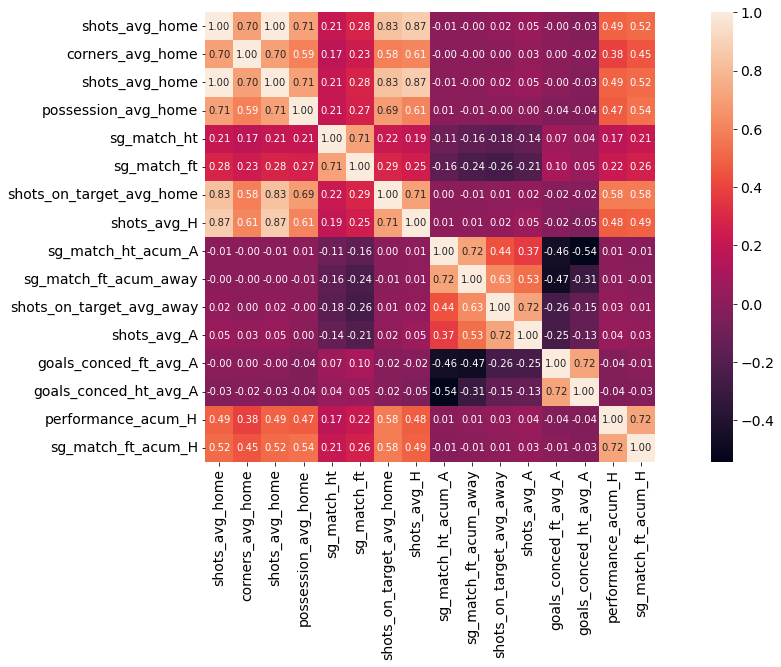

In [26]:
import plotly.express as px
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import pyplot
# selection de variables corrélées dans une heatmap 
# utilisation de RcParams afin de configurer de base la taille de nos futur graphiques.
matplotlib.rcParams['font.size'] = 14
rcParams['figure.figsize'] = 20.10,8.27
sns.heatmap(Selection_for_cor.corr(),cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10});

La heatmap ci dessus est une concatenation des valeurs les plus corrélées sur un critére de selection a partir de 0.70 , afin de purger le trés grand nombre de variable dans le dataset.
La heatmap confirme bien la relation relevé précedement concernant le nombre de tirs au but élévé pour une équipe a domicile ; une équipe a domcile tir plus au but mais pas seulement, ici on observe que la précision vient jouer un rôle dans la performance de l'équipe a domicile.
Il en ressort également que la possesion est toujour plus favorable a l'équipe jouant a domicile que l'équipe jouant a l'extérieur.
Il serait donc intérresant de comparer les tirs au but a l'extérieur et a domicile plus loin dans notre analyse et d'y ajouter la precision des tirs afin d'en ressortir une analyse plus profonde.
Peut être serait il intérresant de faire une ébauche visuel sur le rôle de la possesion dans les résultats d'une équipe suivant qu'elle joue a domicile ou a l'extérieur.
L'analyse des buts sera donc un élément important lors de l'exploration visuelle des données selon la heatmap ci dessus.

# B. Analyse global du championnat

### Data Viz

In [27]:
import plotly.express as px
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import rcParams

### Nombres de match par saisons

### DataFrame pivot  des données afin d'en ressortir des visualisation nécessaire

In [28]:
#Group by par saison et par équipe du nombre de points à domicile et à l'éxterieur

Classement_par_saison = Clean_Full_PL.groupby(['season', 'home_team']).agg({'Home_points': [ 'sum']})
Classement_par_saison['Away_points'] = Clean_Full_PL.groupby(['season', 'away_team']).agg({'Away_points': [ 'sum']})
Classement_par_saison.columns = ['Home_points','Away_points']

#Somme du nombre de points total par équipe sur la saison
Classement_par_saison['Total_points'] = Classement_par_saison['Home_points'] + Classement_par_saison['Away_points']
#Classement_par_saison.reset_index(inplace=True)

#Affichage de toutes les lignes du data frame afin de s'assurer que le group by est correct

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
Classement_par_saison

Home_points  Away_points  Total_points
season home_team                                                       
10/11  Arsenal                            37           31            68
       Aston Villa                        31           17            48
       Birmingham City                    26           13            39
       Blackburn Rovers                   28           15            43
       Blackpool                          20           19            39
       Bolton Wanderers                   35           11            46
       Chelsea                            45           26            71
       Everton                            34           20            54
       Fulham                             31           18            49
       Liverpool                          40           18            58
       Manchester City                    43           28            71
       Manchester United                  55           25            80
       Newcastle United                   26           20            46
       Stoke City                         34           12            46
       Sunderland                         26           21            47
       Tottenham Hotspur                  36           26            62
       West Bromwich Albion               30           17            47
       West Ham United                    20           13            33
       Wigan Athletic                     23           19            42
       Wolverhampton Wanderers            28           12            40
11/12  Arsenal                            40           30            70
       Aston Villa                        19           19            38
       Blackburn Rovers                   19           12            31
       Bolton Wanderers                   16           20            36
       Chelsea                            39           25            64
       Everton                            33           23            56
       Fulham                             35           17            52
       Liverpool                          27           25            52
       Manchester City                    55           34            89
       Manchester United                  47           42            89
       Newcastle United                   38           27            65
       Norwich City                       27           20            47
       Queens Park Rangers                26           11            37
       Stoke City                         29           16            45
       Sunderland                         28           17            45
       Swansea City                       31           16            47
       Tottenham Hotspur                  42           27            69
       West Bromwich Albion               21           26            47
       Wigan Athletic                     22           21            43
       Wolverhampton Wanderers            12           13            25
12/13  Arsenal                            38           35            73
       Aston Villa                        20           21            41
       Chelsea                            41           34            75
       Everton                            42           21            63
       Fulham                             24           19            43
       Liverpool                          33           28            61
       Manchester City                    45           33            78
       Manchester United                  48           41            89
       Newcastle United                   28           13            41
       Norwich City                       31           13            44
       Queens Park Rangers                14           11            25
       Reading                            20            8            28
       Southampton                        25           16            41
       Stoke City                         28           14            42
 

* Ce dataframe nous permettra de reconstituer le classement des équipes par saison et par nombre de point que nous enchérierons des variables quantitatives ci dessous :

In [29]:
# Enrichissement du group by par le nombre de but marqués à domicile, à l'éxterieur et total
Classement_par_saison['Home_goals'] = Clean_Full_PL.groupby(['season', 'home_team']).agg({'home': [ 'sum']})
Classement_par_saison['Away_goals'] = Clean_Full_PL.groupby(['season', 'away_team']).agg({'away': [ 'sum']})
Classement_par_saison['Total_goals'] = Classement_par_saison['Home_goals'] + Classement_par_saison['Away_goals']
 
#Enrichissement du group by par le nombre de match à domicile, à l'éxterieur et total
Classement_par_saison['Home_Games'] = Clean_Full_PL.groupby(['season', 'home_team']).agg({'home': [ 'count']})
Classement_par_saison['Away_Games'] = Clean_Full_PL.groupby(['season', 'away_team']).agg({'away': [ 'count']})
Classement_par_saison['Total_Games'] = Classement_par_saison['Home_Games'] + Classement_par_saison['Away_Games']

#Enrichissement de la moyenne de but par match par saison à domicile, à l'exterieur et total
Classement_par_saison['Home Goals/Game'] = Classement_par_saison['Home_goals']/Classement_par_saison['Home_Games']
Classement_par_saison['Away Goals/Game'] = Classement_par_saison['Away_goals']/Classement_par_saison['Away_Games']
Classement_par_saison['Goals/Game'] = Classement_par_saison['Total_goals']/Classement_par_saison['Total_Games']
Classement_par_saison.reset_index(inplace=True)
Classement_par_saison

,season,home_team,Home_points,Away_points,Total_points,Home_goals,Away_goals,Total_goals,Home_Games,Away_Games,Total_Games,Home Goals/Game,Away Goals/Game,Goals/Game
0,10/11,Arsenal,37,31,68,33,39,72,19,19,38,1.736842,2.052632,1.894737
1,10/11,Aston Villa,31,17,48,26,22,48,19,19,38,1.368421,1.157895,1.263158
2,10/11,Birmingham City,26,13,39,19,18,37,19,19,38,1.000000,0.947368,0.973684
3,10/11,Blackburn Rovers,28,15,43,22,24,46,19,19,38,1.157895,1.263158,1.210526
4,10/11,Blackpool,20,19,39,30,25,55,19,19,38,1.578947,1.315789,1.447368
5,10/11,Bolton Wanderers,35,11,46,34,18,52,19,19,38,1.789474,0.947368,1.368421
6,10/11,Chelsea,45,26,71,39,30,69,19,19,38,2.052632,1.578947,1.815789
7,10/11,Everton,34,20,54,31,20,51,19,19,38,1.631579,1.052632,1.342105
8,10/11,Fulham,31,18,49,30,19,49,19,19,38,1.578947,1.000000,1.289474
9,10/11,Liverpool,40,18,58,37,22,59,19,19,38,1.947368,1.157895,1.552632


* Afin de faciliter la compréhension de l'utilisation du scraping , nous avons fait le choix de garder l'ancien barplot sous forme d'image qui sera partager avec le projet afin de justifier notre démarche de webscriping sur le projet.

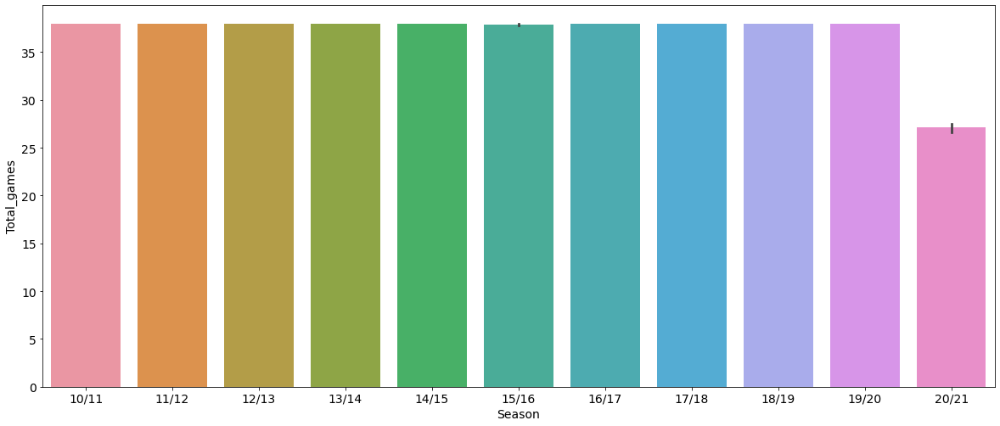

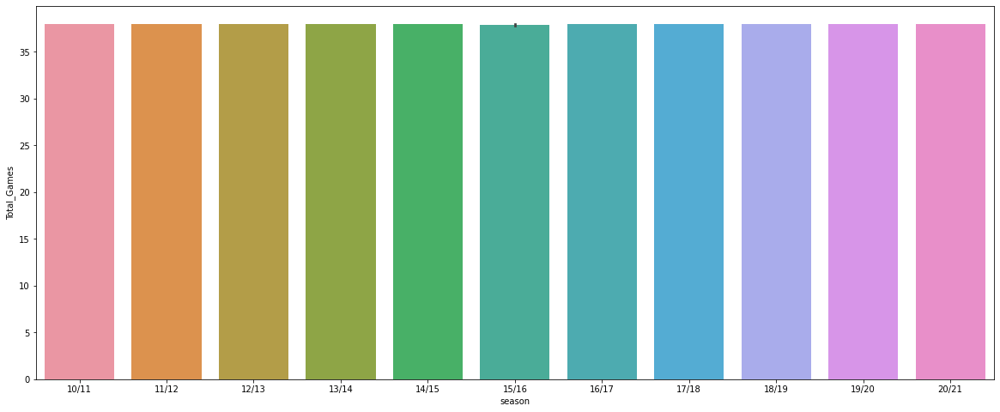

In [30]:
plt.figure(figsize=(20,8))
sns.barplot('season', 'Total_Games', data =Classement_par_saison);

## Vu d'ensemble résultats/performances Premiere league

<Figure size 720x360 with 0 Axes>

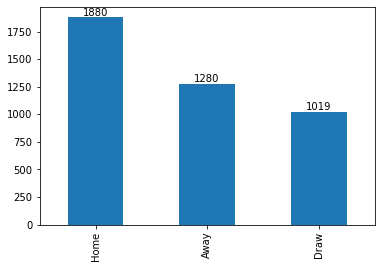

In [31]:
# graphique mettant en représentation le nombres total de victoires/defaites suivant que l'équipe joue a l'extérieur ou a domicile en incluant le nombres de matches nuls
plt.figure(figsize=(10,5))
fig,ax = plt.subplots()
Clean_Full_PL['Winner'].value_counts().plot.bar(ax = ax)
for i in ax.containers:
    ax.bar_label(i,)

In [32]:
avg_goals = pd.DataFrame(Clean_Full_PL.groupby('home_team')['home'].mean()).reset_index()
avg_goals['away'] = list(pd.DataFrame(Clean_Full_PL.groupby('away_team')['away'].mean()).reset_index()['away']) 
avg_goals.columns = ['Team','Home Average','Away Average']

### Nombres de buts par saison

In [33]:
#Dans un deuxième temps, il est intéressant de garder une vision global sur l'ensemble du dataframe, on regroupe alors les saisons entre elles et exploitons de manière général un visuel de données.
Full_premier_league_saison = Clean_Full_PL.groupby(['season']).sum()
Full_premier_league_saison[['goal_home_ft', 'goal_away_ft']]

,goal_home_ft,goal_away_ft
season,,
10/11,617.0,446.0
11/12,604.0,462.0
12/13,592.0,471.0
13/14,598.0,454.0
14/15,560.0,415.0
15/16,566.0,459.0
16/17,607.0,457.0
17/18,582.0,436.0
18/19,596.0,476.0


In [34]:
# Nous allons créer un dataframe regroupant les buts par saisons en fusionant les but a domicile et les buts a l'extérieur sans distinction d'équipe
Full_premier_league_saison['Goals'] = Full_premier_league_saison['goal_home_ft'] + Full_premier_league_saison['goal_away_ft']
Full_premier_league_saison = Full_premier_league_saison.reset_index()
Full_premier_league_saison

,season,Unnamed: 0,home_clearances,home_corners,home_fouls_conceded,home_offsides,home_passes,home_possession,home_red_cards,home_shots,home_shots_on_target,home_tackles,home_touches,home_yellow_cards,away_clearances,away_corners,away_fouls_conceded,away_offsides,away_passes,away_possession,away_red_cards,away_shots,away_shots_on_target,away_tackles,away_touches,away_yellow_cards,goal_home_ft,goal_away_ft,sg_match_ft,goal_home_ht,goal_away_ht,sg_match_ht,clearances_avg_H,corners_avg_H,fouls_conceded_avg_H,offsides_avg_H,passes_avg_H,possession_avg_H,red_cards_avg_H,shots_avg_H,shots_on_target_avg_H,tackles_avg_H,touches_avg_H,yellow_cards_avg_H,goals_scored_ft_avg_H,goals_conced_ft_avg_H,sg_match_ft_acum_H,goals_scored_ht_avg_H,goals_conced_ht_avg_H,sg_match_ht_acum_H,performance_acum_H,clearances_avg_A,corners_avg_A,fouls_conceded_avg_A,offsides_avg_A,passes_avg_A,possession_avg_A,red_cards_avg_A,shots_avg_A,shots_on_target_avg_A,tackles_avg_A,touches_avg_A,yellow_cards_avg_A,goals_scored_ft_avg_A,goals_conced_ft_avg_A,sg_match_ft_acum_A,goals_scored_ht_avg_A,goals_conced_ht_avg_A,sg_match_ht_acum_A,performance_acum_A,clearances_avg_home,corners_avg_home,fouls_conceded_avg_home,offsides_avg_home,passes_avg_home,possession_avg_home,red_cards_avg_home,shots_avg_home,shots_on_target_avg_home,tackles_avg_home,touches_avg_home,yellow_cards_avg_home,goals_scored_ft_avg_home,goals_conced_ft_avg_home,sg_match_ft_acum_home,goals_scored_ht_avg_home,goals_conced_ht_avg_home,sg_match_ht_acum_home,performance_acum_home,clearances_avg_away,corners_avg_away,fouls_conceded_avg_away,offsides_avg_away,passes_avg_away,possession_avg_away,red_cards_avg_away,shots_avg_away,shots_on_target_avg_away,tackles_avg_away,touches_avg_away,yellow_cards_avg_away,goals_scored_ft_avg_away,goals_conced_ft_avg_away,sg_match_ft_acum_away,goals_scored_ht_avg_away,goals_conced_ht_avg_away,sg_match_ht_acum_away,performance_acum_away,Unnamed: 0,home,away,Home_points,Away_points,Goals
0,10/11,72010.0,11524.0,2276.0,4486.0,940.0,153453.0,19215.7,29.0,6146.0,1951.0,7672.0,235904.0,532.0,13242.0,1887.0,4729.0,859.0,150795.0,18784.3,36.0,4904.0,1556.0,7897.0,232528.0,690.0,617.0,446.0,171.0,276.0,200.0,76.0,11429.5,2290.5,4633.8,963.0,156061.8,19340.3,31.2,6206.2,1941.2,7624.9,238418.7,559.1,611.36,430.82,1561.0,257.23,182.34,650.0,21010.7,13407.7,1848.9,4772.8,842.8,151318.3,18645.7,39.6,4788.3,1495.4,7836.6,232531.6,686.0,430.13,602.58,-1571.0,179.98,253.72,-675.0,12968.7,12529.0,2060.3,4704.5,897.9,153553.2,19012.8,37.4,5471.9,1700.7,7744.0,235421.7,622.6,507.32,530.71,-85.0,212.69,226.52,-44.0,16518.9,12427.9,2080.3,4721.6,915.1,153371.5,18992.2,37.5,5532.4,1726.9,7752.8,235344.2,615.7,529.12,506.69,84.0,225.27,212.67,33.0,17419.4,0.0,617,446,648,381,1063.0
1,11/12,216410.0,10168.0,2468.0,4077.0,855.0,166824.0,19532.8,26.0,6115.0,1944.0,7113.0,244154.0,515.0,12387.0,1852.0,4230.0,837.0,157889.0,18467.2,40.0,4776.0,1578.0,7202.0,234870.0,639.0,604.0,462.0,142.0,267.0,197.0,70.0,10204.3,2340.1,4253.4,848.9,162696.0,19395.2,34.9,6070.5,1926.0,7222.8,240038.2,573.9,585.38,472.10,1144.0,250.20,204.46,432.0,19175.6,12174.2,1879.7,4272.3,852.3,156121.9,18590.1,36.1,4842.4,1607.1,7169.5,233076.9,690.9,467.74,585.02,-1162.0,202.66,250.72,-454.0,15538.8,11268.3,2100.4,4257.4,852.5,159356.0,19020.1,37.7,5448.2,1761.8,7199.3,236560.1,638.8,524.23,532.14,-60.0,224.95,228.30,-28.0,17265.7,11196.7,2124.4,4276.5,851.6,158967.1,18976.7,37.1,5514.6,1780.2,7202.8,236123.4,633.2,529.24,525.61,47.0,227.75,226.07,21.0,17353.5,0.0,604,462,606,441,1066.0
2,12/13,360810.0,11145.0,2400.0,4199.0,906.0,163895.0,19349.3,26.0,5915.0,1932.0,7212.0,242454.0,514.0,13408.0,1834.0,4363.0,830.0,159398.0,18650.7,26.0,4645.0,1577.0,7328.0,237190.0,665.0,592.0,471.0,121.0,246.0,218.0,28.0,10951.8,2353.3,4370.5,794.0,166665.6,19413.2,25.1,5916.7,1906.0,7201.3,244094.2,477.8,608.02,467.42,1272.0,253.64,217.78,263.0,20487.1,13250.7,1776.9,4358.9,796.0,160164.7,18541.8,26.4,4633.1,1545.5,7445.9,236876.1,655.

In [35]:
#paramètrage graphique
#sns.set_style('darkgrid')
#matplotlib.rcParams['font.size'] = 14
#matplotlib.rcParams['figure.figsize'] = (20, 5)
#matplotlib.rcParams['figure.facecolor'] = '#00000000'

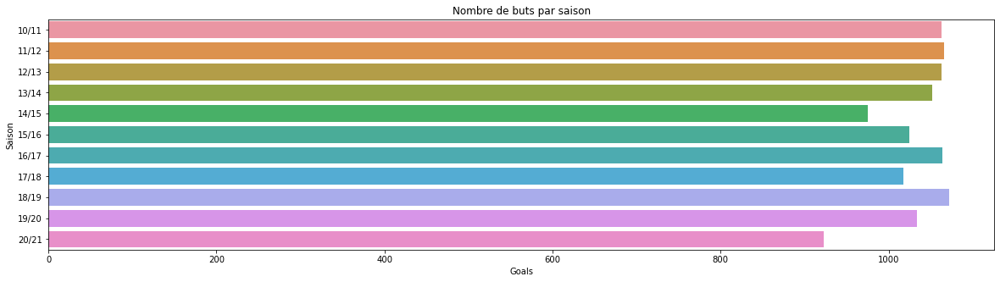

In [36]:
# exploitation sur un barplot de seaborn pour la représentation visuel
plt.figure(figsize=(20,5))
sns.barplot(x = "Goals",y= "season",   data = Full_premier_league_saison)
plt.title('Nombre de buts par saison') 
plt.ylabel('Saison');

In [37]:
mean_goal_saison =Full_premier_league_saison['Goals'].mean()
print(mean_goal_saison)
# a effectuer avant de remplir le champs ci dessous

1032.2727272727273


### Nous pouvons voir dans ce graphique les éléments suivants : 
     - Chaque saison comprend environ ???????????? buts
     - La saison 14/15 se situe en dessous de cette moyenne et donc la plus faible saison
     - La saison 20/21 n'est pas complète donc le nombre de buts n'est pas significatif et n'est pas a prendre en compte

In [38]:
# creation d'un nouveau dataframe afin de remodeler les données des buts a domicile et a l'extérieur par saison grâce a la fonction melt 
Full_premier_league_saison_melted = Full_premier_league_saison[['season','home', 'away']]
# on isole ici la saison et on creer un format long des buts a domcile et a l'extérieur que l'on renomera Buts
Full_premier_league_saison_melt = Full_premier_league_saison_melted.melt("season", var_name = 'GD/GE', value_name ='Buts')
Full_premier_league_saison_melt

,season,GD/GE,Buts
0,10/11,home,617
1,11/12,home,604
2,12/13,home,592
3,13/14,home,598
4,14/15,home,560
5,15/16,home,566
6,16/17,home,607
7,17/18,home,582
8,18/19,home,596
9,19/20,home,576


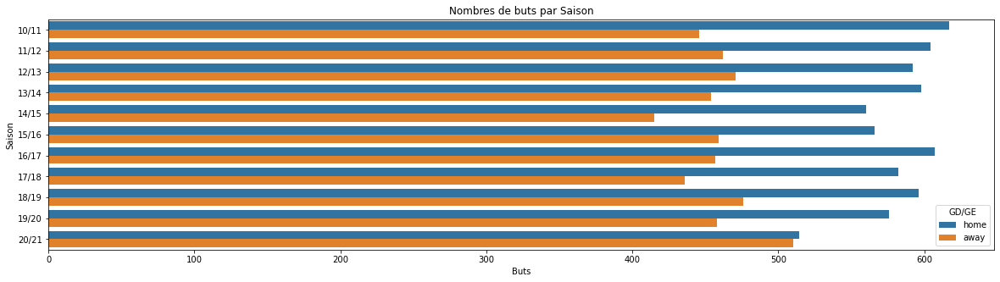

In [39]:
# Exploitation du nouveau dataframe dans un barplot qui nous permettra de mettre en évidence de façon général, le nombre de buts a domicile et a l'extérieur sur l'ensemble des équipes par saisons
plt.figure(figsize=(20,5))
sns.barplot('Buts', 'season', hue = 'GD/GE',data = Full_premier_league_saison_melt)
plt.title('Nombres de buts par Saison') 
plt.ylabel('Saison');

### Classement des équipes par saison selon le nombres de buts 

In [40]:
#Utilisation de la fonction groupby afin de regrouper les données lié a chaque équipe a domicile et a l'extérieur en deux dataframe distinct
Full_premier_league_home = Clean_Full_PL.groupby(Clean_Full_PL.home_team)
Full_premier_league_away = Clean_Full_PL.groupby(Clean_Full_PL.away_team)

In [41]:
# on utilise ensuite ces deux dataframe afin de faire la somme des buts a domicile et a l'extérieur pour chaque équipe
Full_premier_league_team_goals = Full_premier_league_home['home'].sum() + Full_premier_league_away['away'].sum()
Full_premier_league_team_goals =Full_premier_league_team_goals.reset_index()
# l'utilisation de la fonction rename nous permet de renomer les colonnes due a la manipulation de donnée ou les noms n'était pas adapté au contexte
Full_premier_league_team_goals.rename( columns={0 :'Buts', 'home_team': 'Team'}, inplace=True )
# Enfin on utilise la fonction sort values afin de classifier les équipes ayant marqué le plus de buts dans la totalité des saisons
Full_premier_league_team_goals = Full_premier_league_team_goals.sort_values(['Buts'], ascending=False)
Full_premier_league_team_goals

,Team,Buts
19,Manchester City,941
18,Liverpool,796
1,Arsenal,757
20,Manchester United,754
10,Chelsea,749
31,Tottenham Hotspur,725
12,Everton,575
34,West Ham United,495
22,Newcastle United,449
27,Southampton,437


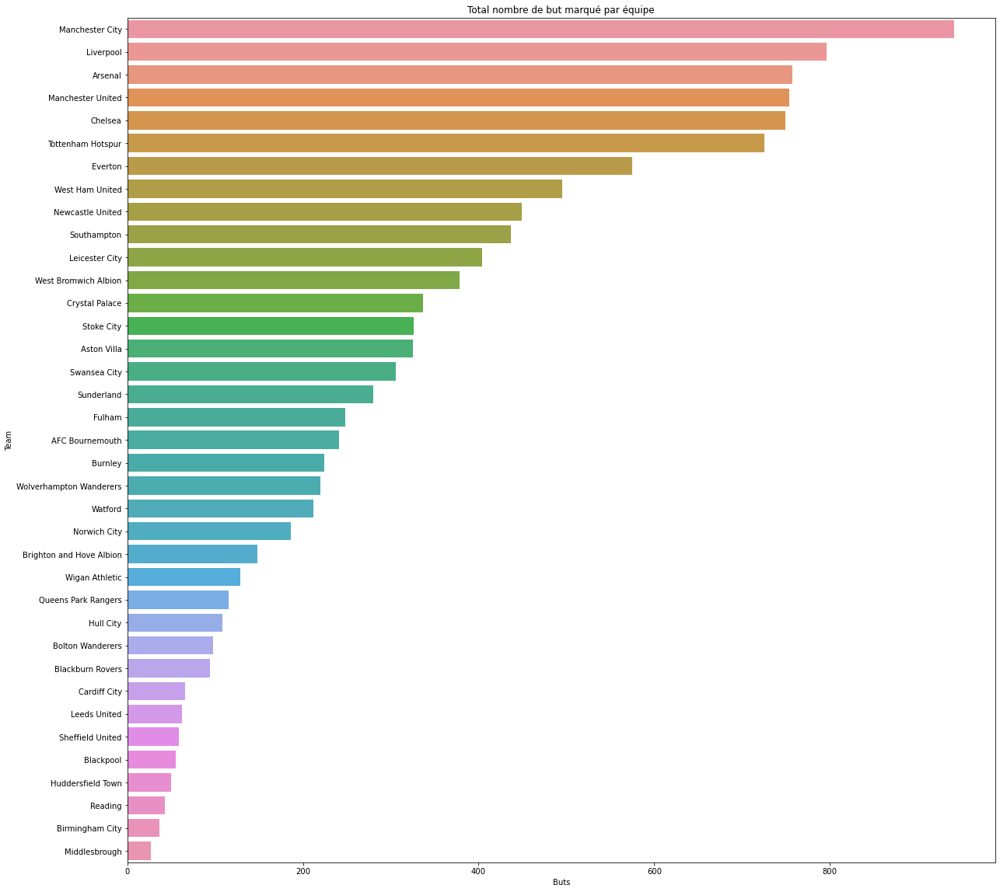

In [42]:
matplotlib.rcParams['figure.figsize'] = (20, 20)
sns.barplot("Buts",'Team', data = Full_premier_league_team_goals )
plt.title('Total nombre de but marqué par équipe')
plt.ylabel('Team');

Sans suprise nous pouvons observer en tête de liste les 6 équipe appartenant au big 6 du championnat anglais.

##  Heatmap contenant la distribution du nombre de buts par mois

   Nous allons ici tracer une heatmap retraçant la distribution des buts par mois. Nous allons nous appuyer sur la fonction appelée pivot de pandas, qui permet de transformer un dataframe en matrix 2D.
   Le premier argument (series) sera les lignes , le deuxième argument correspondera au colonne et le 3ème argument sera les valeurs correspondant au premier et au deuxième argument.

In [43]:
PL_Heat = Clean_Full_PL.groupby(['season','Month']).sum().reset_index()
PL_Heat['Goals'] = PL_Heat['home']+ PL_Heat['away']
Final = PL_Heat.pivot('season', 'Month', 'Goals')
Final

Month,01,02,03,04,05,06,07,08,09,10,11,12
season,,,,,,,,,,,,
10/11,120.0,128.0,64.0,134.0,108.0,NaN,NaN,86.0,81.0,89.0,157.0,96.0
11/12,102.0,105.0,120.0,138.0,68.0,NaN,NaN,72.0,87.0,136.0,86.0,152.0
12/13,117.0,87.0,91.0,105.0,96.0,NaN,NaN,57.0,111.0,95.0,121.0,183.0
13/14,112.0,97.0,151.0,117.0,66.0,NaN,NaN,54.0,82.0,83.0,97.0,193.0
14/15,99.0,91.0,83.0,104.0,106.0,NaN,NaN,81.0,88.0,90.0,87.0,146.0
15/16,114.0,96.0,87.0,139.0,96.0,NaN,NaN,98.0,88.0,105.0,90.0,112.0
16/17,108.0,83.0,78.0,146.0,114.0,NaN,NaN,72.0,106.0,92.0,91.0,174.0
17/18,111.0,88.0,91.0,111.0,62.0,NaN,NaN,73.0,95.0,91.0,110.0,186.0
18/19,113.0,109.0,95.0,125.0,61.0,NaN,NaN,89.0,107.0,81.0,83.0,209.0


Nous allons ensuite exprimer ces données dans la heatmap, il ne faut pas oublier l'argument annot configurer sur True afin de faire apparaitre les valeurs sur la heatmap.

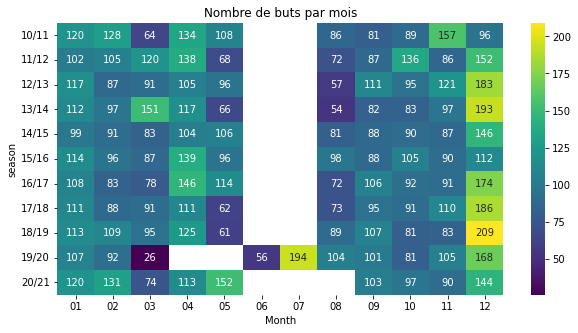

In [44]:
plt.figure(figsize=(10,5))
sns.heatmap( Final , annot= True, cmap = 'viridis', fmt ='g')
plt.title('Nombre de buts par mois');

Le graphique ci dessus nous en apprend plus concernant les buts:
-Le mois de décembre est le moment de la saison ou il y a le plus de nombres de buts; suite au nombre important de matchs disputés durant ce mois.
-Les performances du mois de mars des deux dernières saisons ont été affectées par la pandémie.

## Comparaison des tirs au but domicile/ extérieur

Nous allons utiliser ici une lineplot de seaborn afin de faire apparaitre les différences entre les tirs a domicile et les tirs a l'extérieur en y incluant la précision trier par saison.

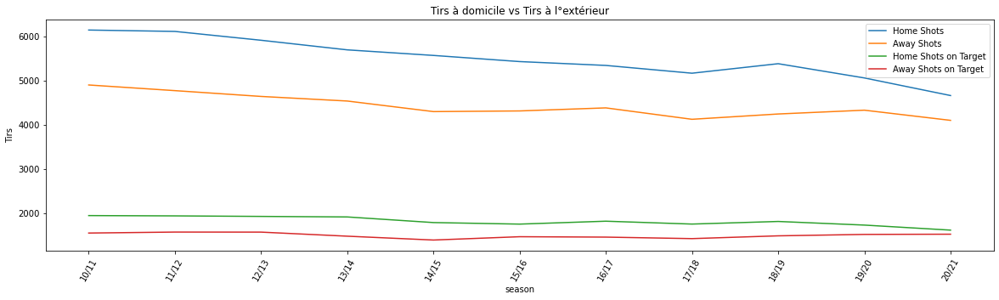

In [45]:
plt.figure(figsize=(20,5))
sns.lineplot(Full_premier_league_saison.season, Full_premier_league_saison.home_shots, data = Full_premier_league_saison)
sns.lineplot(Full_premier_league_saison.season, Full_premier_league_saison.away_shots, data = Full_premier_league_saison)
sns.lineplot(Full_premier_league_saison.season, Full_premier_league_saison.home_shots_on_target, data = Full_premier_league_saison)
sns.lineplot(Full_premier_league_saison.season, Full_premier_league_saison.away_shots_on_target, data = Full_premier_league_saison)
plt.legend(['Home Shots','Away Shots','Home Shots on Target','Away Shots on Target' ])
plt.ylabel('Tirs')
plt.title('Tirs à domicile vs Tirs à l°extérieur') 
plt.xticks(rotation=60);

### Mise en valeur de 4 critères selectionner concernant le nombres de buts 

In [46]:
fig = px.scatter(avg_goals,x='Home Average',y='Away Average',color='Team',title = 'Domicile/Exterieur Performance avec Equipes de la PL')
fig.add_hline(y=1.099552708794958,line_dash='dash',line_width=1,line_color='red')
fig.add_vline(x=1.3823472204742036,line_dash='dash',line_width=1,line_color='red')
fig.add_annotation(x=2,y=1.9,text='Ces équipes marquent autant à<br>Domicile que Exterieur',showarrow=False)
fig.add_annotation(x=2,y=0.8,text='Ces équipes marquent plus à<br> Domicile que Extérieur',showarrow=False)
fig.add_annotation(x=0.78,y=1.9,text='Ces équipes marquent plus à<br> Extérieur que Domicile',showarrow=False)
fig.add_annotation(x=0.78,y=0.8,text='Ces équipes marquent moin à<br> Domicile que Extérieur',showarrow=False)

### Big 6

In [47]:
Seasongbbig6 = Classement_par_saison.sort_values("Total_points", ascending=False).groupby("season").head(6)
Seasongbbig6.rename(columns = {'home_team':'Team'}, inplace=True)
Seasongbbig6.sort_values("season", ascending = False)


,season,Team,Home_points,Away_points,Total_points,Home_goals,Away_goals,Total_goals,Home_Games,Away_Games,Total_Games,Home Goals/Game,Away Goals/Game,Goals/Game
210,20/21,Liverpool,33,36,69,29,39,68,19,19,38,1.526316,2.052632,1.789474
212,20/21,Manchester United,31,43,74,38,35,73,19,19,38,2.000000,1.842105,1.921053
218,20/21,West Ham United,34,31,65,32,30,62,19,19,38,1.684211,1.578947,1.631579
211,20/21,Manchester City,41,45,86,43,40,83,19,19,38,2.263158,2.105263,2.184211
209,20/21,Leicester City,28,38,66,34,34,68,19,19,38,1.789474,1.789474,1.789474
204,20/21,Chelsea,33,34,67,31,27,58,19,19,38,1.631579,1.421053,1.526316
191,19/20,Manchester United,37,29,66,40,26,66,19,19,38,2.105263,1.368421,1.736842
199,19/20,Wolverhampton Wanderers,31,28,59,27,24,51,19,19,38,1.421053,1.263158,1.342105
188,19/20,Leicester City,37,25,62,35,32,67,19,19,38,1.842105,1.684211,1.763158
189,19/20,Liverpool,55,44,99,52,33,85,19,19,38,2.736842,1.736842,2.236842


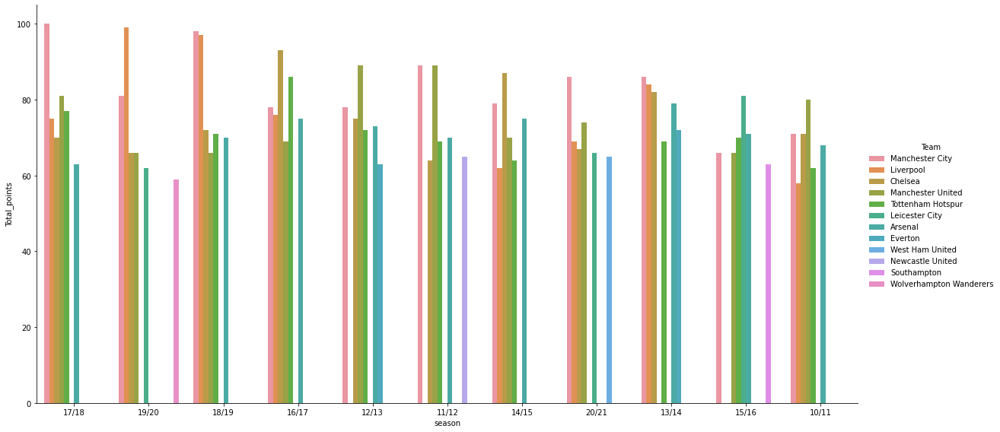

In [48]:
sns.catplot(x='season', y='Total_points', hue='Team', kind='bar', data=Seasongbbig6,linewidth = 10, height=8, aspect=2)

## C. Analyse détaillé de la performance d'Arsenal

### 1.Orientations des données

In [49]:
#Victoire d'arsenal par saison 

count_10 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '10/11':
        if Clean_Full_PL['Team_Winer'].iloc[i] == 'Arsenal':
            count_10+=1
count_11 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '11/12':
        if Clean_Full_PL['Team_Winer'].iloc[i] == 'Arsenal':
            count_11+=1
count_12 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '12/13':
        if Clean_Full_PL['Team_Winer'].iloc[i] == 'Arsenal':
            count_12+=1
count_13 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '13/14':
        if Clean_Full_PL['Team_Winer'].iloc[i] == 'Arsenal':
            count_13+=1
count_14 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '14/15':
        if Clean_Full_PL['Team_Winer'].iloc[i] == 'Arsenal':
            count_14+=1
    
count_15 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '15/16':
        if Clean_Full_PL['Team_Winer'].iloc[i] == 'Arsenal':
            count_15+=1
count_16 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '16/17':
        if Clean_Full_PL['Team_Winer'].iloc[i] == 'Arsenal':
            count_16+=1
count_17 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '17/18':
        if Clean_Full_PL['Team_Winer'].iloc[i] == 'Arsenal':
            count_17+=1
count_18 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '18/19':
        if Clean_Full_PL['Team_Winer'].iloc[i] == 'Arsenal':
            count_18+=1
count_19 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '19/20':
        if Clean_Full_PL['Team_Winer'].iloc[i] == 'Arsenal':
            count_19+=1
count_20 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '20/21':
        if Clean_Full_PL['Team_Winer'].iloc[i] == 'Arsenal':
            count_20+=1


wins = [count_10,count_11,count_12,count_13,count_14,count_15,count_16,count_17,count_18,count_19,count_20]

wins

[19, 21, 21, 24, 22, 20, 23, 19, 21, 14, 18]

In [50]:
#défaite d'arsenal par saison 

count_10 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '10/11':
        if Clean_Full_PL['Team_looser'].iloc[i] == 'Arsenal':
            count_10+=1
count_11 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '11/12':
        if Clean_Full_PL['Team_looser'].iloc[i] == 'Arsenal':
            count_11+=1
count_12 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '12/13':
        if Clean_Full_PL['Team_looser'].iloc[i] == 'Arsenal':
            count_12+=1
count_13 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '13/14':
        if Clean_Full_PL['Team_looser'].iloc[i] == 'Arsenal':
            count_13+=1
count_14 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '14/15':
        if Clean_Full_PL['Team_looser'].iloc[i] == 'Arsenal':
            count_14+=1
    
count_15 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '15/16':
        if Clean_Full_PL['Team_looser'].iloc[i] == 'Arsenal':
            count_15+=1
count_16 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '16/17':
        if Clean_Full_PL['Team_looser'].iloc[i] == 'Arsenal':
            count_16+=1
count_17 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '17/18':
        if Clean_Full_PL['Team_looser'].iloc[i] == 'Arsenal':
            count_17+=1
count_18 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '18/19':
        if Clean_Full_PL['Team_looser'].iloc[i] == 'Arsenal':
            count_18+=1
count_19 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '19/20':
        if Clean_Full_PL['Team_looser'].iloc[i] == 'Arsenal':
            count_19+=1
count_20 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '20/21':
        if Clean_Full_PL['Team_looser'].iloc[i] == 'Arsenal':
            count_20+=1


looses = [count_10,count_11,count_12,count_13,count_14,count_15,count_16,count_17,count_18,count_19,count_20]

looses


[8, 10, 7, 7, 7, 7, 9, 13, 10, 10, 13]

In [51]:
count_10 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '10/11':
        if ((Clean_Full_PL['home_team'].iloc[i] == 'Arsenal') | (Clean_Full_PL['away_team'].iloc[i] =='Arsenal')) & (Clean_Full_PL['Team_Winer'].iloc[i] =='Draw'): 
            count_10+=1
count_11 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '11/12':
        if ((Clean_Full_PL['home_team'].iloc[i] == 'Arsenal') | (Clean_Full_PL['away_team'].iloc[i] =='Arsenal')) & (Clean_Full_PL['Team_Winer'].iloc[i] =='Draw'): 
            count_11+=1
count_12 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '12/13':
        if ((Clean_Full_PL['home_team'].iloc[i] == 'Arsenal') | (Clean_Full_PL['away_team'].iloc[i] =='Arsenal')) & (Clean_Full_PL['Team_Winer'].iloc[i] =='Draw'):  
            count_12+=1
count_13 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '13/14':
        if ((Clean_Full_PL['home_team'].iloc[i] == 'Arsenal') | (Clean_Full_PL['away_team'].iloc[i] =='Arsenal')) & (Clean_Full_PL['Team_Winer'].iloc[i] =='Draw'): 
            count_13+=1
count_14 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '14/15':
        if ((Clean_Full_PL['home_team'].iloc[i] == 'Arsenal') | (Clean_Full_PL['away_team'].iloc[i] =='Arsenal')) & (Clean_Full_PL['Team_Winer'].iloc[i] =='Draw'): 
            count_14+=1
    
count_15 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '15/16':
        if ((Clean_Full_PL['home_team'].iloc[i] == 'Arsenal') | (Clean_Full_PL['away_team'].iloc[i] =='Arsenal')) & (Clean_Full_PL['Team_Winer'].iloc[i] =='Draw'): 
            count_15+=1
count_16 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '16/17':
        if ((Clean_Full_PL['home_team'].iloc[i] == 'Arsenal') | (Clean_Full_PL['away_team'].iloc[i] =='Arsenal')) & (Clean_Full_PL['Team_Winer'].iloc[i] =='Draw'): 
            count_16+=1
count_17 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '17/18':
        if ((Clean_Full_PL['home_team'].iloc[i] == 'Arsenal') | (Clean_Full_PL['away_team'].iloc[i] =='Arsenal')) & (Clean_Full_PL['Team_Winer'].iloc[i] =='Draw'): 
            count_17+=1
count_18 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '18/19':
        if ((Clean_Full_PL['home_team'].iloc[i] == 'Arsenal') | (Clean_Full_PL['away_team'].iloc[i] =='Arsenal')) & (Clean_Full_PL['Team_Winer'].iloc[i] =='Draw'): 
            count_18+=1
count_19 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '19/20':
        if ((Clean_Full_PL['home_team'].iloc[i] == 'Arsenal') | (Clean_Full_PL['away_team'].iloc[i] =='Arsenal')) & (Clean_Full_PL['Team_Winer'].iloc[i] =='Draw'): 
            count_19+=1
count_20 = 0
for i in range(len(Clean_Full_PL['away_team'])):
    if Clean_Full_PL['season'].iloc[i] == '20/21':
        if ((Clean_Full_PL['home_team'].iloc[i] == 'Arsenal') | (Clean_Full_PL['away_team'].iloc[i] =='Arsenal')) & (Clean_Full_PL['Team_Winer'].iloc[i] =='Draw'): 
            count_20+=1

draws = [count_10,count_11,count_12,count_13,count_14,count_15,count_16,count_17,count_18,count_19,count_20]
draws


[11, 7, 10, 7, 9, 11, 6, 6, 7, 14, 7]

### Visualisation Victoires/Defaites/Matches nuls 

<Figure size 1440x432 with 0 Axes>

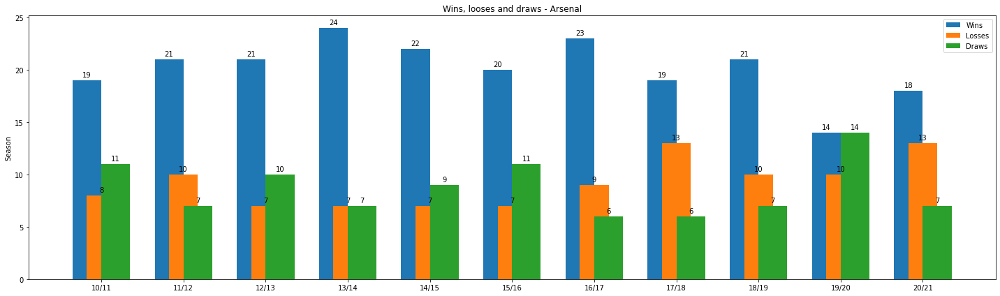

In [52]:
import matplotlib.pyplot as plt
import numpy as np
plt.figure(figsize=(20,6))
plt.rcParams["figure.figsize"] = (20,6)

seasons = ['10/11','11/12','12/13','13/14','14/15','15/16','16/17','17/18','18/19','19/20','20/21']

labels = seasons
wins = wins
looses = looses
draws = draws


x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, wins, width, label='Wins')
rects2 = ax.bar(x , looses, width, label='Losses')
rects3 = ax.bar(x+ width/2,draws,width,label='Draws')


# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Season')
ax.set_title('Wins, looses and draws - Arsenal')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

ax.bar_label(rects1, padding=3)
ax.bar_label(rects2, padding=3)
ax.bar_label(rects3, padding=3)

fig.tight_layout()

### Pie chart pourcentage Victoires/Defaites/Nul Arsenal

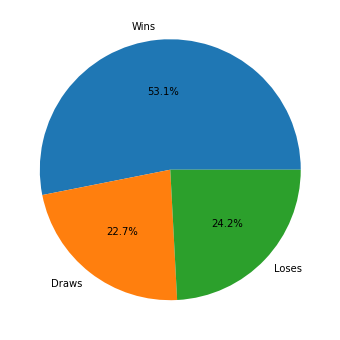

In [53]:
x = np.array([sum(wins)/407,sum(draws)/407,sum(looses)/407])
labels = ['Wins','Draws','Loses']
plt.pie(x,labels=labels,autopct='%1.1f%%');
#plt.savefig('pie_10')

In [54]:
# utlisation de la librairie statistics afin de ressortir la moyenne selon le résultat obtenu
import statistics
 
from statistics import mean
import seaborn as sns

moyenne_wins =mean(wins)
moyenne_looses =mean(looses)
moyenne_draw =mean(draws)

In [55]:
print(moyenne_wins)
print(moyenne_looses)
print(moyenne_draw)

20.181818181818183
9.181818181818182
8.636363636363637


### Analyse des buts 

In [56]:
#Comparaison des buts marqués à domicile et à l'exterieur à la mi temps et à la fin du match
Clean_Full_PL['home_goals_fulltime'] = Clean_Full_PL['result_full'].str.split('-').str[0]
Clean_Full_PL['away_goals_fulltime'] = Clean_Full_PL['result_full'].str.split('-').str[1]
Clean_Full_PL['home_goals_halftime'] = Clean_Full_PL['result_ht'].str.split('-').str[0]
Clean_Full_PL['away_goals_halftime'] = Clean_Full_PL['result_ht'].str.split('-').str[1]

Clean_Full_PL.head()

,Unnamed: 0,link_match,season,date,home_team,away_team,result_full,result_ht,home_clearances,home_corners,home_fouls_conceded,home_offsides,home_passes,home_possession,home_red_cards,home_shots,home_shots_on_target,home_tackles,home_touches,home_yellow_cards,away_clearances,away_corners,away_fouls_conceded,away_offsides,away_passes,away_possession,away_red_cards,away_shots,away_shots_on_target,away_tackles,away_touches,away_yellow_cards,goal_home_ft,goal_away_ft,sg_match_ft,goal_home_ht,goal_away_ht,sg_match_ht,clearances_avg_H,corners_avg_H,fouls_conceded_avg_H,offsides_avg_H,passes_avg_H,possession_avg_H,red_cards_avg_H,shots_avg_H,shots_on_target_avg_H,tackles_avg_H,touches_avg_H,yellow_cards_avg_H,goals_scored_ft_avg_H,goals_conced_ft_avg_H,sg_match_ft_acum_H,goals_scored_ht_avg_H,goals_conced_ht_avg_H,sg_match_ht_acum_H,performance_acum_H,clearances_avg_A,corners_avg_A,fouls_conceded_avg_A,offsides_avg_A,passes_avg_A,possession_avg_A,red_cards_avg_A,shots_avg_A,shots_on_target_avg_A,tackles_avg_A,touches_avg_A,yellow_cards_avg_A,goals_scored_ft_avg_A,goals_conced_ft_avg_A,sg_match_ft_acum_A,goals_scored_ht_avg_A,goals_conced_ht_avg_A,sg_match_ht_acum_A,performance_acum_A,clearances_avg_home,corners_avg_home,fouls_conceded_avg_home,offsides_avg_home,passes_avg_home,possession_avg_home,red_cards_avg_home,shots_avg_home,shots_on_target_avg_home,tackles_avg_home,touches_avg_home,yellow_cards_avg_home,goals_scored_ft_avg_home,goals_conced_ft_avg_home,sg_match_ft_acum_home,goals_scored_ht_avg_home,goals_conced_ht_avg_home,sg_match_ht_acum_home,performance_acum_home,clearances_avg_away,corners_avg_away,fouls_conceded_avg_away,offsides_avg_away,passes_avg_away,possession_avg_away,red_cards_avg_away,shots_avg_away,shots_on_target_avg_away,tackles_avg_away,touches_avg_away,yellow_cards_avg_away,goals_scored_ft_avg_away,goals_conced_ft_avg_away,sg_match_ft_acum_away,goals_scored_ht_avg_away,goals_conced_ht_avg_away,sg_match_ht_acum_away,performance_acum_away,Unnamed: 0,home,away,Winner,Year,Month,date_1,Team_Winer,Team_looser,ARSENAL,Home_points,Away_points,home_goals_fulltime,away_goals_fulltime,home_goals_halftime,away_goals_halftime
0,0.0,https://www.premierleague.com/match/7186,10/11,2010-11-01,Blackpool,West Bromwich Albion,2-1,1-0,15.0,8.0,16.0,2.0,550.0,65.4,0.0,26.0,5.0,19.0,740.0,2.0,25.0,2.0,13.0,3.0,280.0,34.6,2.0,14.0,4.0,15.0,472.0,3.0,2.0,1.0,1.0,1.0,0.0,1.0,41.0,5.0,11.7,3.7,453.7,56.2,0.0,16.0,4.0,22.0,682.7,1.0,1.67,2.33,-2.0,0.00,0.67,-2.0,11.1,34.0,3.8,10.8,2.8,357.5,42.3,0.2,11.0,2.8,23.8,572.8,1.2,1.25,2.75,-6.0,0.00,1.00,-4.0,33.3,38.4,4.6,11.3,3.4,407.9,48.3,0.1,12.9,4.4,18.8,619.1,1.2,1.44,2.22,-7.0,0.67,1.11,-4.0,37.0,32.1,5.1,10.8,2.7,371.0,46.9,0.1,14.3,4.1,20.0,584.9,1.6,1.44,1.67,-2.0,0.33,0.78,-4.0,55.6,NaN,2,1,Home,2010,11,01,Blackpool,West Bromwich Albion,other,3,0,2,1,1,0
1,1.0,https://www.premierleague.com/match/7404,10/11,2011-04-11,Liverpool,Manchester City,3-0,3-0,16.0,6.0,6.0,5.0,527.0,53.1,0.0,21.0,5.0,31.0,750.0,1.0,17.0,2.0,3.0,0.0,465.0,46.9,0.0,12.0,2.0,27.0,687.0,0.0,3.0,0.0,3.0,3.0,0.0,3.0,28.8,6.7,12.3,2.7,434.7,52.3,0.1,16.5,5.9,24.7,658.3,1.2,1.73,0.80,14.0,0.80,0.27,8.0,68.9,35.1,4.7,13.9,3.1,480.3,53.3,0.1,12.5,3.6,22.5,698.7,2.5,1.47,1.07,6.0,0.80,0.27,8.0,48.9,29.8,5.6,12.3,2.2,440.1,52.7,0.1,15.3,5.3,24.0,659.5,1.6,1.35,1.23,4.0,0.55,0.42,4.0,48.4,31.0,6.1,13.3,3.0,467.2,52.8,0.2,14.3,4.6,22.0,681.4,2.0,1.61,0.87,23.0,0.87,0.32,17.0,60.2,NaN,3,0,Home,2011,04,11,Liverpool,Manchester City,other,3,0,3,0,3,0
2,2.0,https://www.premierleague.com/match/7255,10/11,2010-12-13,Manchester United,Arsenal,1-0,1-0,26.0,5.0,9.0,3.0,430.0,46.1,0.0,17.0,6.0,27.0,635.0,0.0,33.0,4.0,17.0,0.0,499.0,53.9,0.0,11.0,5.0,20.0,737.0,4.0,1.0,0.0,1.0,1.0,0.0,1.0,20.0,5.4,9.5,2.8,540.9,58.4,0.0,18.5,6.6,20.4,740.1,1.1,3.00,0.75,18.0,1.50,0.00,12.0,91.7,37.6,6.5,12.0,1.6,503.0,56.4,0.2,15.5,5.0,22.8,733.5,1.6,1.88,1.00,7.0,0.88,0.25,5.0,70.8,29.1,6.1,10.8,2.9,517.3,57.6,0.0,16.5,5.6,17.3,726.1,1.6,2.33,1.07,19

<Figure size 1440x432 with 0 Axes>

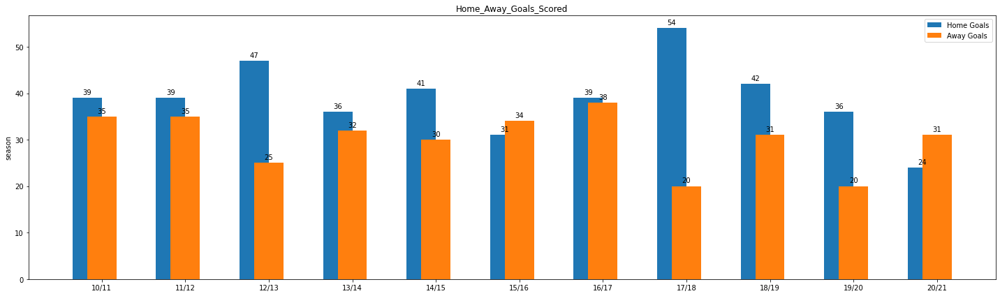

In [57]:
goals_home_10 = 0
goals_away_10 = 0
Clean_Full_PL['home_goals_fulltime']  = Clean_Full_PL['home_goals_fulltime'].astype(int)
Clean_Full_PL['away_goals_fulltime'] = Clean_Full_PL['away_goals_fulltime'].astype(int)
for i in range(len(Clean_Full_PL['season'])):
    if Clean_Full_PL['season'].iloc[i] == '11/12':
        if Clean_Full_PL['home_team'].iloc[i] == 'Arsenal':
            goals_home_10 += (Clean_Full_PL['home_goals_fulltime'].iloc[i])
        elif Clean_Full_PL['away_team'].iloc[i] == 'Arsenal':
            goals_away_10 += (Clean_Full_PL['away_goals_fulltime'].iloc[i])

goals_home_11 = 0
goals_away_11 = 0
Clean_Full_PL['home_goals_fulltime']  = Clean_Full_PL['home_goals_fulltime'].astype(int)
Clean_Full_PL['away_goals_fulltime'] = Clean_Full_PL['away_goals_fulltime'].astype(int)
for i in range(len(Clean_Full_PL['season'])):
    if Clean_Full_PL['season'].iloc[i] == '11/12':
        if Clean_Full_PL['home_team'].iloc[i] == 'Arsenal':
            goals_home_11 += (Clean_Full_PL['home_goals_fulltime'].iloc[i])
        elif Clean_Full_PL['away_team'].iloc[i] == 'Arsenal':
            goals_away_11 += (Clean_Full_PL['away_goals_fulltime'].iloc[i])
            
goals_home_12 = 0
goals_away_12 = 0
Clean_Full_PL['home_goals_fulltime']  = Clean_Full_PL['home_goals_fulltime'].astype(int)
Clean_Full_PL['away_goals_fulltime'] = Clean_Full_PL['away_goals_fulltime'].astype(int)
for i in range(len(Clean_Full_PL['season'])):
    if Clean_Full_PL['season'].iloc[i] == '12/13':
        if Clean_Full_PL['home_team'].iloc[i] == 'Arsenal':
            goals_home_12 += (Clean_Full_PL['home_goals_fulltime'].iloc[i])
        elif Clean_Full_PL['away_team'].iloc[i] == 'Arsenal':
            goals_away_12 += (Clean_Full_PL['away_goals_fulltime'].iloc[i])
        
        
goals_home_13 = 0
goals_away_13 = 0
Clean_Full_PL['home_goals_fulltime']  = Clean_Full_PL['home_goals_fulltime'].astype(int)
Clean_Full_PL['away_goals_fulltime'] = Clean_Full_PL['away_goals_fulltime'].astype(int)
for i in range(len(Clean_Full_PL['season'])):
    if Clean_Full_PL['season'].iloc[i] == '13/14':
        if Clean_Full_PL['home_team'].iloc[i] == 'Arsenal':
            goals_home_13 += (Clean_Full_PL['home_goals_fulltime'].iloc[i])
        elif Clean_Full_PL['away_team'].iloc[i] == 'Arsenal':
            goals_away_13 += (Clean_Full_PL['away_goals_fulltime'].iloc[i])
        
goals_home_14 = 0
goals_away_14 = 0
Clean_Full_PL['home_goals_fulltime']  = Clean_Full_PL['home_goals_fulltime'].astype(int)
Clean_Full_PL['away_goals_fulltime'] = Clean_Full_PL['away_goals_fulltime'].astype(int)
for i in range(len(Clean_Full_PL['season'])):
    if Clean_Full_PL['season'].iloc[i] == '14/15':
        if Clean_Full_PL['home_team'].iloc[i] == 'Arsenal':
            goals_home_14 += (Clean_Full_PL['home_goals_fulltime'].iloc[i])
        elif Clean_Full_PL['away_team'].iloc[i] == 'Arsenal':
            goals_away_14 += (Clean_Full_PL['away_goals_fulltime'].iloc[i])
        
goals_home_15 = 0
goals_away_15 = 0
Clean_Full_PL['home_goals_fulltime']  = Clean_Full_PL['home_goals_fulltime'].astype(int)
Clean_Full_PL['away_goals_fulltime'] = Clean_Full_PL['away_goals_fulltime'].astype(int)
for i in range(len(Clean_Full_PL['season'])):
    if Clean_Full_PL['season'].iloc[i] == '15/16':
        if Clean_Full_PL['home_team'].iloc[i] == 'Arsenal':
            goals_home_15 += (Clean_Full_PL['home_goals_fulltime'].iloc[i])
        elif Clean_Full_PL['away_team'].iloc[i] == 'Arsenal':
            goals_away_15 += (Clean_Full_PL['away_goals_fulltime'].iloc[i])
        
        
goals_home_16 = 0
goals_away_16 = 0
Clean_Full_PL['home_goals_fulltime']  = Clean_Full_PL['home_goals_fulltime'].astype(int)
Clean_Full_PL['away_goals_fulltime'] = Clean_Full_PL['away_goals_fulltime'].astype(int)
for i in range(len(Clean_Full_PL['season'])):
    if Clean_Full_PL['season'].iloc[i] == '16/17':
        if Clean_Full_PL['home_team'].iloc[i] == 'Arsenal':
            goals_home_16 += (Clean_Full_PL['home_goals_fulltime'].iloc[i])
        elif Clean_Full_PL['away_team'].iloc[i] == 'Arsenal':
            goals_away_16 += (Clean_Full_PL['away_goals_fulltime'].iloc[i])
        
goals_home_17 = 0
goals_away_17 = 0
Clean_Full_PL['home_goals_fulltime']  = Clean_Full_PL['home_goals_fulltime'].astype(int)
Clean_Full_PL['away_goals_fulltime'] = Clean_Full_PL['away_goals_fulltime'].astype(int)
for i in range(len(Clean_Full_PL['season'])):
    if Clean_Full_PL['season'].iloc[i] == '17/18':
        if Clean_Full_PL['home_team'].iloc[i] == 'Arsenal':
            goals_home_17 += (Clean_Full_PL['home_goals_fulltime'].iloc[i])
        elif Clean_Full_PL['away_team'].iloc[i] == 'Arsenal':
            goals_away_17 += (Clean_Full_PL['away_goals_fulltime'].iloc[i])
        

goals_home_18 = 0
goals_away_18 = 0
Clean_Full_PL['home_goals_fulltime']  = Clean_Full_PL['home_goals_fulltime'].astype(int)
Clean_Full_PL['away_goals_fulltime'] = Clean_Full_PL['away_goals_fulltime'].astype(int)
for i in range(len(Clean_Full_PL['season'])):
    if Clean_Full_PL['season'].iloc[i] == '18/19':
        if Clean_Full_PL['home_team'].iloc[i] == 'Arsenal':
            goals_home_18 += (Clean_Full_PL['home_goals_fulltime'].iloc[i])
        elif Clean_Full_PL['away_team'].iloc[i] == 'Arsenal':
            goals_away_18 += (Clean_Full_PL['away_goals_fulltime'].iloc[i])
        

        
goals_home_19 = 0
goals_away_19 = 0
Clean_Full_PL['home_goals_fulltime']  = Clean_Full_PL['home_goals_fulltime'].astype(int)
Clean_Full_PL['away_goals_fulltime'] = Clean_Full_PL['away_goals_fulltime'].astype(int)
for i in range(len(Clean_Full_PL['season'])):
    if Clean_Full_PL['season'].iloc[i] == '19/20':
        if Clean_Full_PL['home_team'].iloc[i] == 'Arsenal':
            goals_home_19 += (Clean_Full_PL['home_goals_fulltime'].iloc[i])
        elif Clean_Full_PL['away_team'].iloc[i] == 'Arsenal':
            goals_away_19 += (Clean_Full_PL['away_goals_fulltime'].iloc[i])
        
goals_home_20 = 0
goals_away_20 = 0
Clean_Full_PL['home_goals_fulltime']  = Clean_Full_PL['home_goals_fulltime'].astype(int)
Clean_Full_PL['away_goals_fulltime'] = Clean_Full_PL['away_goals_fulltime'].astype(int)
for i in range(len(Clean_Full_PL['season'])):
    if Clean_Full_PL['season'].iloc[i] == '20/21':
        if Clean_Full_PL['home_team'].iloc[i] == 'Arsenal':
            goals_home_20 += (Clean_Full_PL['home_goals_fulltime'].iloc[i])
        elif Clean_Full_PL['away_team'].iloc[i] == 'Arsenal':
            goals_away_20 += (Clean_Full_PL['away_goals_fulltime'].iloc[i])

home_goals = [goals_home_10,goals_home_11,goals_home_12,goals_home_13,goals_home_14,goals_home_15,goals_home_16,goals_home_17,goals_home_18,goals_home_19,goals_home_20]
away_goals = [goals_away_10,goals_away_11,goals_away_12,goals_away_13,goals_away_14,goals_away_15,goals_away_16,goals_away_17,goals_away_18,goals_away_19,goals_away_20]            


import matplotlib.pyplot as plt
import numpy as np
plt.figure(figsize=(20,6))
plt.rcParams["figure.figsize"] = (20,6)


seasons = ['10/11','11/12','12/13','13/14','14/15','15/16','16/17','17/18','18/19','19/20','20/21']


labels = seasons
home_goals = home_goals
away_goals = away_goals

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, home_goals, width, label='Home Goals')
rects2 = ax.bar(x , away_goals, width, label='Away Goals')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('season')
ax.set_title('Home_Away_Goals_Scored')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

ax.bar_label(rects1, padding=3)
ax.bar_label(rects2, padding=3)

fig.tight_layout()

In [58]:
moyenne_homegoals =mean(home_goals)
moyenne_awaygoals =mean(away_goals)

print('moy home goals:',moyenne_homegoals,'','moy away goals:',moyenne_awaygoals)

moy home goals: 38  moy away goals: 30


### Visualisation différente de la distribution des buts 

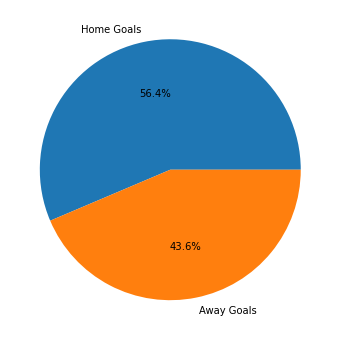

In [59]:
# Pie chart des buts a domicile ou a l'extérieur
total_goals = sum(away_goals) + sum(home_goals)
x = np.array([sum(home_goals)/total_goals,sum(away_goals)/total_goals])
labels = ['Home Goals','Away Goals']
plt.pie(x,labels=labels,autopct='%1.1f%%');

<AxesSubplot:ylabel='Count'>

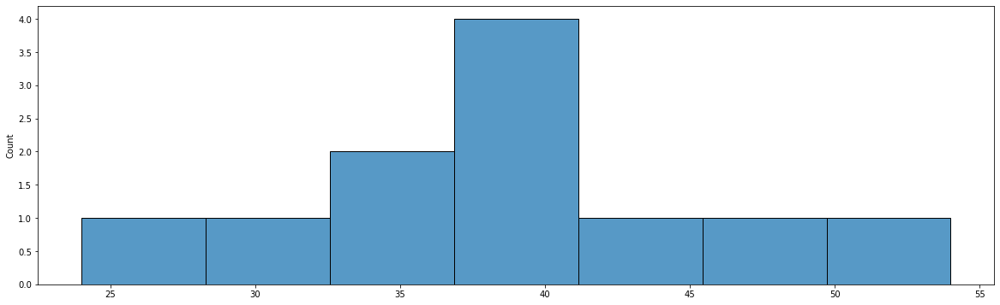

In [60]:
sns.histplot(home_goals)

<AxesSubplot:>

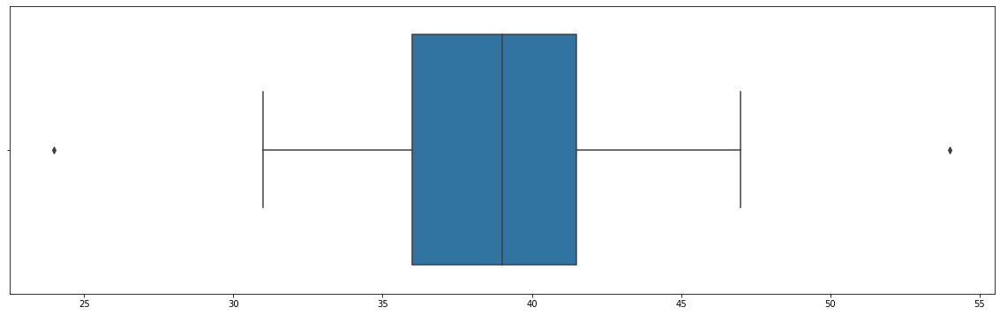

In [61]:
sns.boxplot(home_goals)

<AxesSubplot:ylabel='Count'>

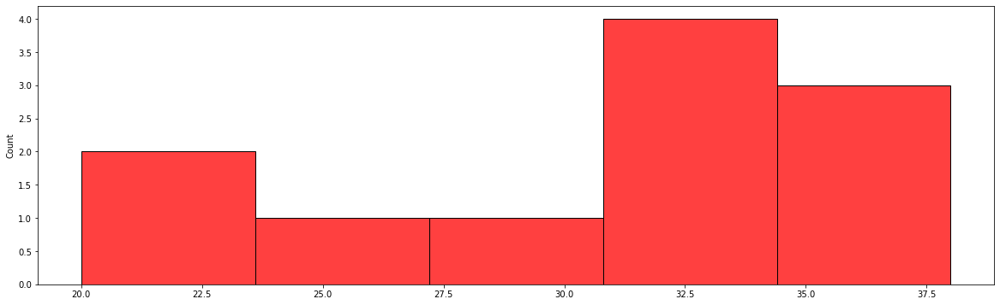

In [62]:
sns.histplot(away_goals,color='r')

<AxesSubplot:>

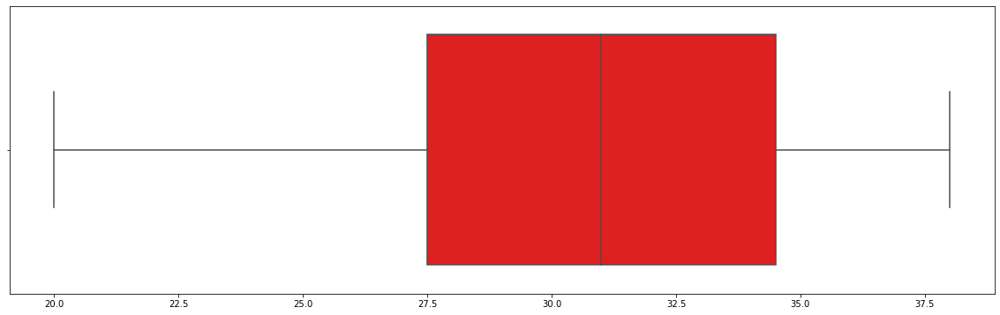

In [63]:
sns.boxplot(away_goals,color='r')

### Analyse staff Arsenal 

In [64]:
Clean_Full_PL['date'] = pd.to_datetime(Full_PL['date'],format= '%Y-%m-%d')

In [65]:
Clean_Full_PL['home_win'] = (Clean_Full_PL.loc[:,'home'] - Clean_Full_PL.loc[:,'away'])>0
Clean_Full_PL['away_win'] = (Clean_Full_PL.loc[:,'away'] - Clean_Full_PL.loc[:,'home'])>0
Clean_Full_PL['home_win'] = Clean_Full_PL['home_win'].astype(int)
Clean_Full_PL['away_win'] = Clean_Full_PL['away_win'].astype(int)

In [66]:
arsenal = Clean_Full_PL[(Clean_Full_PL["home_team"]=="Arsenal")]
wenger = arsenal[arsenal['date']<pd.to_datetime('2018-06-30')]
emery = arsenal[(arsenal['date']<pd.to_datetime('2019-11-28'))&(arsenal['date']>pd.to_datetime('2018-07-01'))]
Ljungberg = arsenal[(arsenal['date']<pd.to_datetime('2019-12-21'))&(arsenal['date']>pd.to_datetime('2019-11-29'))]
arteta = arsenal[arsenal['date']>pd.to_datetime('2018-12-18')]


In [67]:
arsenal = Clean_Full_PL[(Clean_Full_PL["away_team"]=="Arsenal")]
wenger2 = arsenal[arsenal['date']<pd.to_datetime('2018-06-30')]
emery2 = arsenal[(arsenal['date']<pd.to_datetime('2019-11-28'))&(arsenal['date']>pd.to_datetime('2018-07-01'))]
Ljungberg2 = arsenal[(arsenal['date']<pd.to_datetime('2019-12-21'))&(arsenal['date']>pd.to_datetime('2019-11-29'))]
arteta2 = arsenal[arsenal['date']>pd.to_datetime('2018-12-18')]

In [68]:
w = []
l = []
t = []
for i in [wenger, emery, Ljungberg, arteta]:
    w.append(i[i['home_win']==1]['home_win'].sum())
    l.append(i[i['away_win']==1]['away_win'].sum())
    t.append(i['season'].count())
home_wins = pd.DataFrame({'Managers':['wenger','emery','Ljungberg','arteta'],'Wins':w,'Losses':l,'Total':t})
home_wins['Draws'] = home_wins['Total'] - (home_wins['Wins'] + home_wins['Losses'])
home_wins['Home Points'] = home_wins['Wins']*3 + home_wins['Draws']*1
home_wins['Win %'] = round((home_wins['Wins']/ home_wins['Total'])*100,2)
home_wins['Point %'] = round(home_wins['Home Points']/(home_wins['Total']*3)*100,2)

w2 = []
l2 = []
t2 = []

for i in [wenger2, emery2, Ljungberg2, arteta2]:
    w2.append(i[i['away_win']==1]['away_win'].sum())
    l2.append(i[i['home_win']==1]['home_win'].sum())
    t2.append(i['season'].count())
away_wins = pd.DataFrame({'Managers':['wenger','emery','Ljungberg','arteta'],'Wins':w2,'Losses':l2,'Total':t2})
away_wins['Draws'] = away_wins['Total'] - (away_wins['Wins'] + away_wins['Losses'])
away_wins['Home Points'] = away_wins['Wins']*3 + away_wins['Draws']*1
away_wins['Win %'] = round((away_wins['Wins']/ away_wins['Total'])*100,2)
away_wins['Point %'] = round(away_wins['Home Points']/(away_wins['Total']*3)*100,2)
print('Home Table:')
display(home_wins)
print('Away Table:')
display(away_wins)

total = pd.concat([home_wins,away_wins],axis=0)
total['Home/Away'] = ['Home','Home','Home','Home','Away','Away','Away','Away']
px.bar(total,x='Managers',y='Win %',color='Home/Away',barmode='group',text='Win %',title = 'Home/Away Win % by Manager (Wins/Total Games)',hover_data=['Wins','Losses','Total'],color_discrete_sequence=["red", "black"])

Home Table:


,Managers,Wins,Losses,Total,Draws,Home Points,Win %,Point %
0,wenger,100,20,152,32,332,65.79,72.81
1,emery,17,2,26,7,58,65.38,74.36
2,Ljungberg,0,2,2,0,0,0.00,0.00
3,arteta,25,8,42,9,84,59.52,66.67


Away Table:


,Managers,Wins,Losses,Total,Draws,Home Points,Win %,Point %
0,wenger,69,48,152,35,242,45.39,53.07
1,emery,8,11,25,6,30,32.00,40.00
2,Ljungberg,1,0,2,1,4,50.00,66.67
3,arteta,14,17,43,12,54,32.56,41.86


In [69]:
px.bar(total,x='Managers',y='Point %',color='Home/Away',barmode='group',text='Point %',title = 'Home/Away Point % by Manager (Points/Total Possible Points)',hover_data=['Wins','Losses','Total'],color_discrete_sequence=["red", "black"])

In [70]:
o = []
b = []

for i in [wenger, emery, Ljungberg, arteta]:
    o.append(i['home'].mean())
    b.append(i['home'].count())
home = pd.DataFrame({'Managers':['wenger','emery','Ljungberg','arteta'],'Avg Goals':o,'Games Managed':b})
o2 = []
b2 = []

for i in [wenger2, emery2, Ljungberg2, arteta2]:
    o2.append(i['away'].mean())
    b2.append(i['away'].count())
away = pd.DataFrame({'Managers':['wenger','emery','Ljungberg','arteta'],'Avg Goals':o2,'Games Managed':b2})
total = pd.concat([home,away],axis=0)
total = total.round(2)
total2 = home.merge(away,how='inner',on='Managers',suffixes=('_home','_away'))
total2 = total2.round(2)
total['Home/Away'] = ['Home','Home','Home','Home','Away','Away','Away','Away']
display(total2)
px.bar(total,x='Managers',y='Avg Goals',color='Home/Away',barmode='group',text='Avg Goals',title = 'Home/Away Goals For Avg by Manager',hover_data=['Home/Away','Games Managed'],color_discrete_sequence=["red", "black"])

,Managers,Avg Goals_home,Games Managed_home,Avg Goals_away,Games Managed_away
0,wenger,2.11,152,1.66,152
1,emery,2.12,26,1.44,25
2,Ljungberg,0.50,2,2.50,2
3,arteta,1.93,42,1.26,43


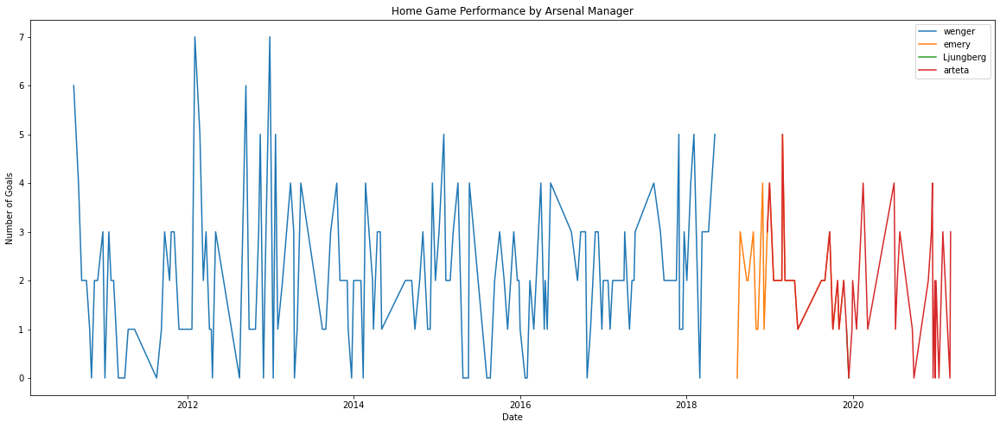

In [71]:
fig, ax = plt.subplots(figsize=(20,8))
sns.lineplot(wenger['date'],wenger['home'],ax=ax,label='wenger')
sns.lineplot(x=emery['date'],y=emery['home'],ax=ax, label='emery')
sns.lineplot(x=Ljungberg['date'],y=Ljungberg['home'],ax=ax, label='Ljungberg')
sns.lineplot(x=arteta['date'],y=arteta['home'],ax=ax, label='arteta')
ax.set_title('Home Game Performance by Arsenal Manager')
ax.set_xlabel('Date')
ax.set_ylabel('Number of Goals');

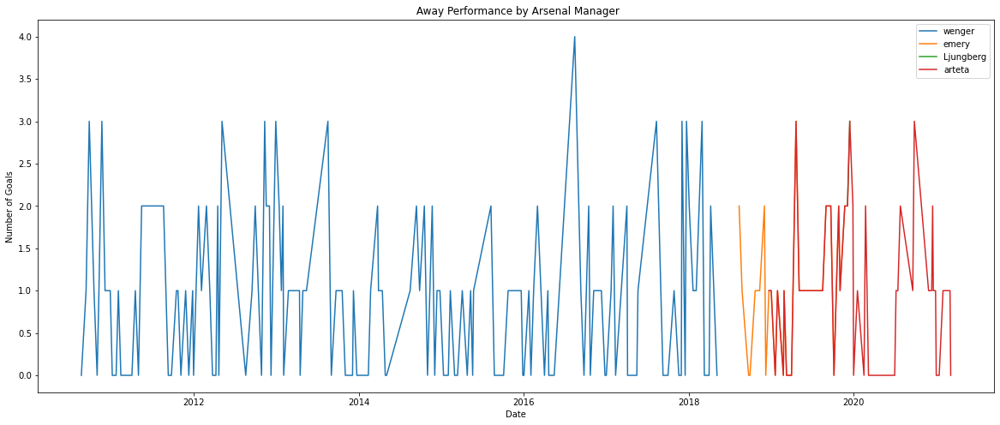

In [72]:
fig, ax = plt.subplots(figsize=(20,8))
sns.lineplot(wenger['date'],wenger['away'],ax=ax,label='wenger')
sns.lineplot(x=emery['date'],y=emery['away'],ax=ax, label='emery')
sns.lineplot(x=Ljungberg['date'],y=Ljungberg['away'],ax=ax, label='Ljungberg')
sns.lineplot(x=arteta['date'],y=arteta['away'],ax=ax, label='arteta')
ax.set_title(' Away Performance by Arsenal Manager')
ax.set_xlabel('Date')
ax.set_ylabel('Number of Goals');

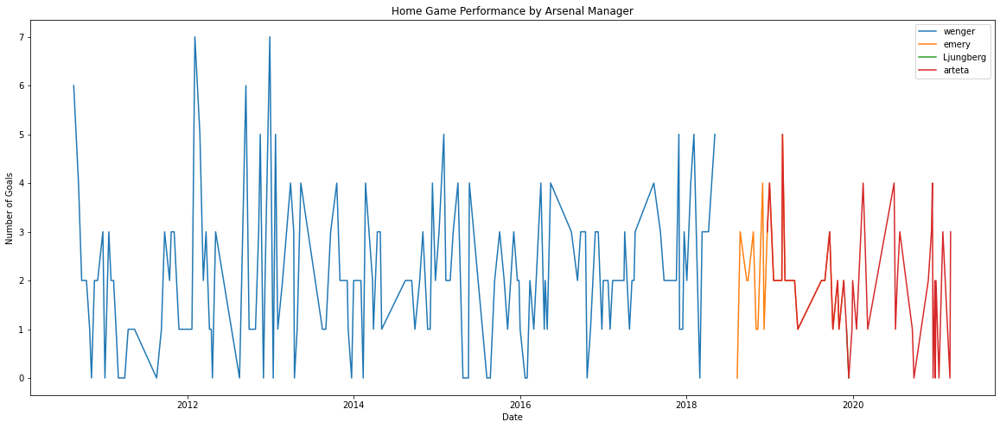

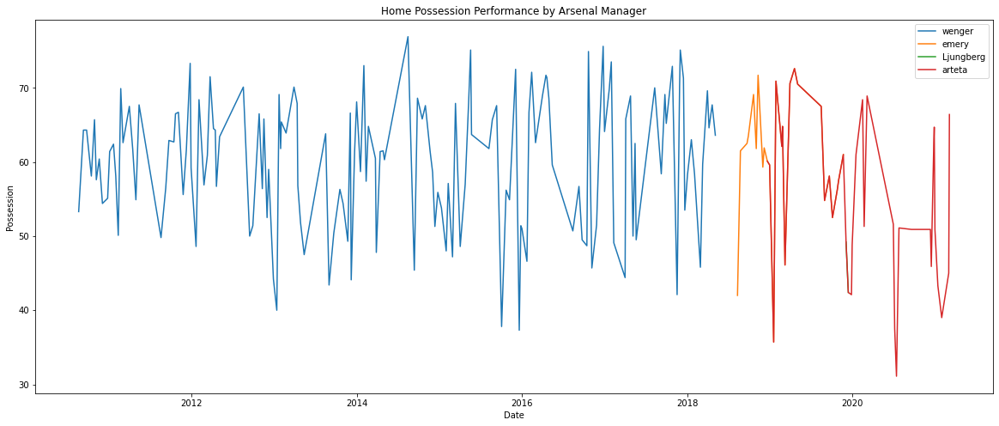

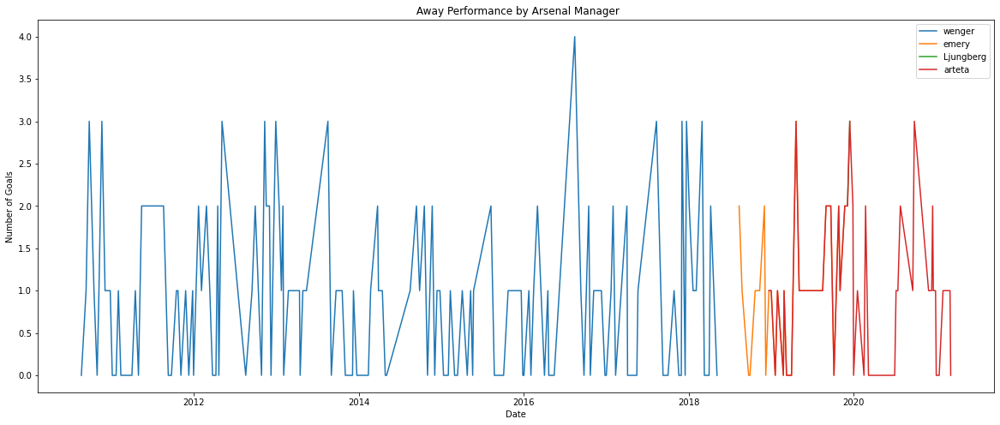

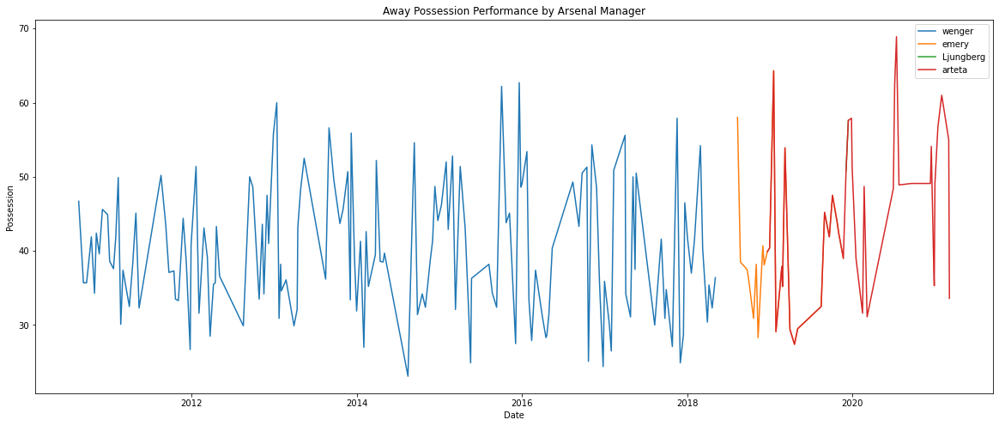

In [73]:
fig, ax = plt.subplots(figsize=(20,8))
sns.lineplot(wenger['date'],wenger['home'],ax=ax,label='wenger')
sns.lineplot(x=emery['date'],y=emery['home'],ax=ax, label='emery')
sns.lineplot(x=Ljungberg['date'],y=Ljungberg['home'],ax=ax, label='Ljungberg')
sns.lineplot(x=arteta['date'],y=arteta['home'],ax=ax, label='arteta')
ax.set_title('Home Game Performance by Arsenal Manager')
ax.set_xlabel('Date')
ax.set_ylabel('Number of Goals');

fig, ax = plt.subplots(figsize=(20,8))
sns.lineplot(wenger['date'],wenger['home_possession'],ax=ax,label='wenger')
sns.lineplot(x=emery['date'],y=emery['home_possession'],ax=ax, label='emery')
sns.lineplot(x=Ljungberg['date'],y=Ljungberg['home_possession'],ax=ax, label='Ljungberg')
sns.lineplot(x=arteta['date'],y=arteta['home_possession'],ax=ax, label='arteta')
ax.set_title('Home Possession Performance by Arsenal Manager')
ax.set_xlabel('Date')
ax.set_ylabel('Possession');

fig, ax = plt.subplots(figsize=(20,8))
sns.lineplot(wenger['date'],wenger['away'],ax=ax,label='wenger')
sns.lineplot(x=emery['date'],y=emery['away'],ax=ax, label='emery')
sns.lineplot(x=Ljungberg['date'],y=Ljungberg['away'],ax=ax, label='Ljungberg')
sns.lineplot(x=arteta['date'],y=arteta['away'],ax=ax, label='arteta')
ax.set_title(' Away Performance by Arsenal Manager')
ax.set_xlabel('Date')
ax.set_ylabel('Number of Goals');

fig, ax = plt.subplots(figsize=(20,8))
sns.lineplot(wenger['date'],wenger['away_possession'],ax=ax,label='wenger')
sns.lineplot(x=emery['date'],y=emery['away_possession'],ax=ax, label='emery')
sns.lineplot(x=Ljungberg['date'],y=Ljungberg['away_possession'],ax=ax, label='Ljungberg')
sns.lineplot(x=arteta['date'],y=arteta['away_possession'],ax=ax, label='arteta')
ax.set_title('Away Possession Performance by Arsenal Manager')
ax.set_xlabel('Date')
ax.set_ylabel('Possession');